In [1]:
# Imports
import re
import h3
import json
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
import datetime 
import warnings
warnings.filterwarnings("ignore")

# Clustering
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler


from edinburgh_challenge.constants import Location
from edinburgh_challenge.utility import generate_early_shift_distributions, bng_to_latlong, calculate_distance
from edinburgh_challenge.models import NaiveModel, GreedyModel, EnhancedModel, SimplifiedModelNotBest, SimplifiedModel, ClosestPoliceStationModel
from edinburgh_challenge.simulation import *
from edinburgh_challenge.processing import *

In [2]:
start_date="01-01-2023"

In [3]:
estates_df = load_estates_df()
ps_coords, shift_distribution, shift_distribution_weekend, police_stations_dict, police_stations = generate_simulation_specs(estates_df)

In [4]:
simulation_data = pd.read_csv("outcomes/simulation_results/simulation_200_closest_ps_results.csv")

In [5]:
resolved_filter = simulation_data["resolved"]==True

In [6]:
simulation_data.shape

(427136, 89)

## Location Index
The idea is to quantify the efficacy of a Police Stations location. 

* Firstly, to understand this, a clustering algorithm is used to identify hotspots of incidents. The hotspots can be confirmed with the hexbin visualisation of demand in locations. 

* Next, using a suitable number of cluster points called demand hotspots, distance or travel time from each police station is calculated. 

* Using the demand hotspots, or cluster centroids, theprobability of incidents popping up in that cluster is calculated.

* Each combination of demand hotspot and police station location is assigned an index -  

    ** Location Index = Prob. of Incident popping up * distance (normalised)

* For each police station, the SQI can be added up and normalised presenting a metric for its efficacy. 

* We can visualize the catchment areas of each Police Station using the mean distance of each incident from the Police Station.

### Hex bin segregation

In [7]:
from h3 import h3

# Load your DataFrame (replace with your actual data)
df = simulation_data.sample(frac=1)

# Define hex resolution
resolution = 7  # Adjust resolution based on desired bin size

# Function to get hex bin for each point
def lat_lon_to_hex(lat, lon, resolution):
    return h3.geo_to_h3(lat, lon, resolution)

# Add hex bin column to DataFrame
df['hex_bin'] = df.apply(lambda row: lat_lon_to_hex(row['latitude'], row['longitude'], resolution), axis=1)

# Aggregate points in each hex bin
hex_bins = df['hex_bin'].value_counts().reset_index()
hex_bins.columns = ['hex_bin', 'point_count']

# Get the centroid of each hex bin
hex_bins['latitude'] = hex_bins['hex_bin'].apply(lambda x: h3.h3_to_geo(x)[0])
hex_bins['longitude'] = hex_bins['hex_bin'].apply(lambda x: h3.h3_to_geo(x)[1])


In [8]:
# Create a new DataFrame by replicating each hex bin according to its point count
replicated_data = pd.DataFrame()
for idx, row in hex_bins.iterrows():
    num_replicas = row['point_count']
    replicas = pd.DataFrame({'hex_bin': [row['hex_bin']] * num_replicas})
    replicated_data = pd.concat([replicated_data, replicas], ignore_index=True)

# Get centroids of replicated hex bins
replicated_data['latitude'] = replicated_data['hex_bin'].apply(lambda x: h3.h3_to_geo(x)[0])
replicated_data['longitude'] = replicated_data['hex_bin'].apply(lambda x: h3.h3_to_geo(x)[1])

### Clustering using Hexbins

Text(0.5, 1.0, 'Elbow curve')

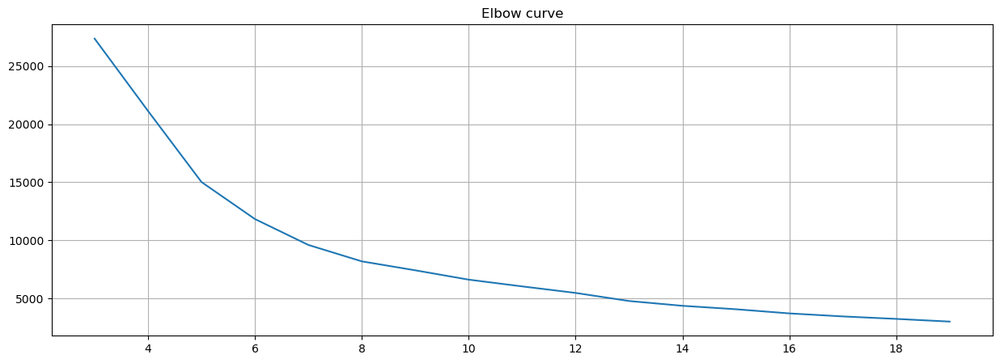

In [9]:
losses = []
range_ = range(3, 20)
for i in range_:
    # Perform clustering (e.g., K-means clustering) on replicated data
    kmeans = KMeans(n_clusters=i, random_state=0).fit(replicated_data[['latitude', 'longitude']])
    replicated_data['cluster'] = kmeans.labels_
    losses.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range_, losses)
plt.grid(True)
plt.title('Elbow curve')

In [10]:
# Decide on the number of clusters based on the total cost
# or variance to be considered
variance_considered = 85 # percent
initial_cost = losses[0]
cost_required = (100 - variance_considered)/100 * initial_cost

def find_closest_cost(numbers, costs, target_cost):
    # Initialize variables to store the closest number and cost
    closest_cost = None
    associated_number = None
    min_difference = float('inf')
    
    # Iterate through the lists using index
    for i in range(len(costs)):
        # Calculate the absolute difference between the current cost and the target cost
        difference = abs(costs[i] - target_cost)
        
        # If this difference is smaller than the previous smallest, update the closest cost and associated number
        if difference < min_difference:
            min_difference = difference
            closest_cost = costs[i]
            associated_number = numbers[i]
            
    return associated_number, closest_cost

closest_number, closest_cost = find_closest_cost(range_, losses, cost_required)
print(f"The closest cost is {closest_cost} with the associated number {closest_number}")

The closest cost is 4080.6430002203774 with the associated number 15


In [11]:
# Get best KMeans Estimator
n_clusters = closest_number
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(replicated_data[['latitude', 'longitude']])

In [12]:
# Get cluster centroids
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=['latitude', 'longitude'])
cluster_centers['cluster'] = cluster_centers.index

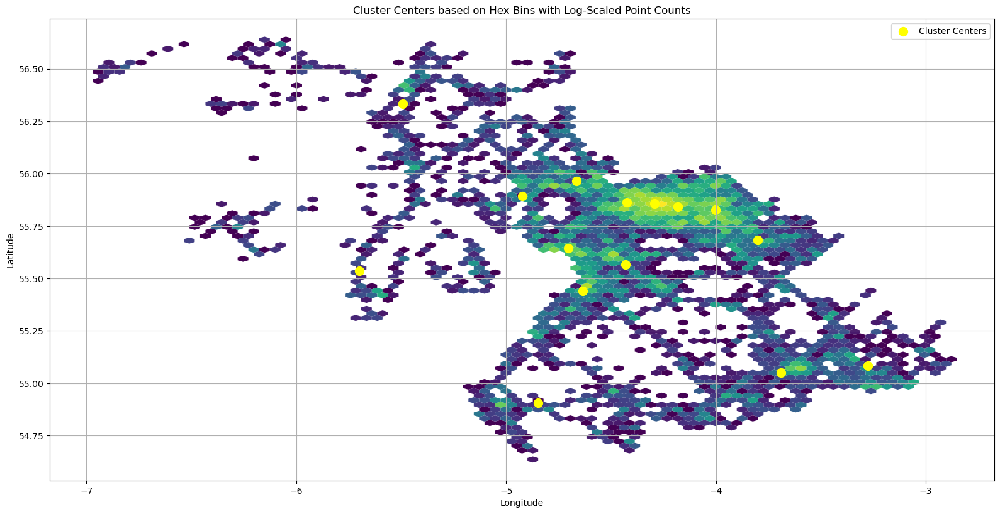

In [13]:
import matplotlib as mpl

# Create GeoDataFrame for cluster centroids
gdf_centers = gpd.GeoDataFrame(cluster_centers, geometry=gpd.points_from_xy(cluster_centers['longitude'], cluster_centers['latitude']))

# Create GeoDataFrame for hex bins
hex_bins['geometry'] = hex_bins['hex_bin'].apply(lambda x: Polygon(h3.h3_to_geo_boundary(x, geo_json=True)))
gdf_hexbins = gpd.GeoDataFrame(hex_bins, geometry='geometry')

# Plot hex bins and cluster centroids
fig, ax = plt.subplots(figsize=(16, 12))

# Apply log scale to point counts
gdf_hexbins['log_point_count'] = np.log1p(gdf_hexbins['point_count'])

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, cmap="viridis", mincnt=1, edgecolors='none',norm=mpl.colors.LogNorm())
# Plot cluster centroids
gdf_centers.plot(ax=ax, color='yellow', markersize=100, label='Cluster Centers')

# Add labels and title
plt.title('Cluster Centers based on Hex Bins with Log-Scaled Point Counts')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(loc="upper right")
plt.grid(True)
plt.tight_layout()

# Customize legend
#legend = ax.get_legend()
#legend.set_bbox_to_anchor((1, 0.5))
#legend.set_frame_on(False)


plt.savefig("outcomes/geographical_cluster_centers.png")






plt.show()

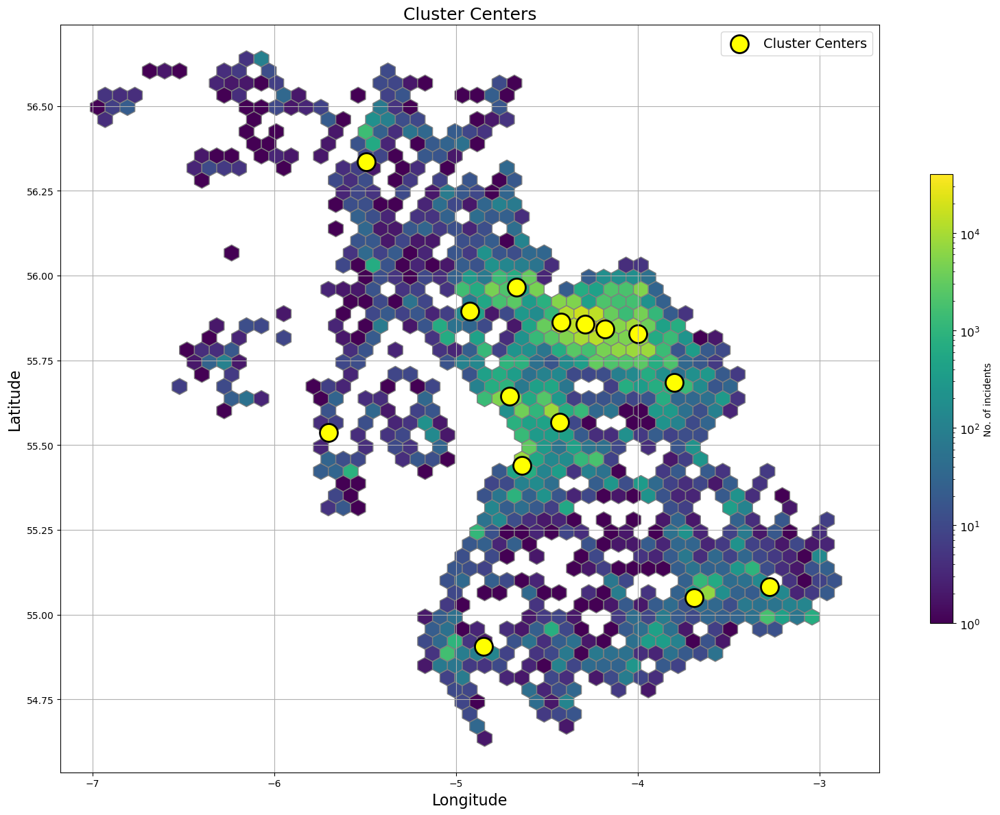

In [14]:
# Create GeoDataFrame for cluster centroids
gdf_centers = gpd.GeoDataFrame(cluster_centers, geometry=gpd.points_from_xy(cluster_centers['longitude'], cluster_centers['latitude']))

# Create GeoDataFrame for hex bins
hex_bins['geometry'] = hex_bins['hex_bin'].apply(lambda x: Polygon(h3.h3_to_geo_boundary(x, geo_json=True)))
gdf_hexbins = gpd.GeoDataFrame(hex_bins, geometry='geometry')

# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], 
                gridsize=50, color="grey", mincnt=1, edgecolors='none',
               norm=mpl.colors.LogNorm(), cmap="viridis")

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)
scatter = plt.scatter(cluster_centers["longitude"], cluster_centers["latitude"],
            color='yellow', label='Cluster Centers', 
            edgecolor='black', linewidth=2, s=350)


# Scatter plot for SFI values
#scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], c=res_index_df_norm['service_provision_index'], cmap='coolwarm', s=200, edgecolors='k')
# Add colorbar with reduced size
cbar = plt.colorbar(hb, ax=ax, shrink=0.6, label='No. of incidents')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
#for i, txt in enumerate(res_index_df_norm['station_number']):
#    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="white")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Cluster Centers', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/cluster_centers.png")
# Show plot
plt.show()


In [15]:
cluster_centers

,latitude,longitude,cluster,geometry
0,55.050222,-3.689042,0,POINT (-3.68904 55.05022)
1,55.856085,-4.291574,1,POINT (-4.29157 55.85608)
2,55.643743,-4.704663,2,POINT (-4.70466 55.64374)
3,55.827197,-4.001112,3,POINT (-4.00111 55.82720)
4,55.964902,-4.666253,4,POINT (-4.66625 55.96490)
5,55.893675,-4.924149,5,POINT (-4.92415 55.89367)
6,54.907192,-4.847200,6,POINT (-4.84720 54.90719)
7,56.334357,-5.492080,7,POINT (-5.49208 56.33436)
8,55.862671,-4.423873,8,POINT (-4.42387 55.86267)
9,55.567098,-4.430699,9,POINT (-4.43070 55.56710)


### Give a probability for each point

In [16]:
# Extract coordinates from data
latitudes = simulation_data['latitude'].values
longitudes = simulation_data['longitude'].values

cluster_latitudes = cluster_centers['latitude'].values
cluster_longitudes = cluster_centers['longitude'].values

# Vectorized calculation of distances
lat1 = np.radians(latitudes[:, np.newaxis])
lon1 = np.radians(longitudes[:, np.newaxis])
lat2 = np.radians(cluster_latitudes)
lon2 = np.radians(cluster_longitudes)

# Performaing the haversine distance calculation
dlat = lat2 - lat1
dlon = lon2 - lon1

a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
c = 2 * np.arcsin(np.sqrt(a))
distances = 6371.0 * c  # Resulting distances (rows: data points, columns: cluster centers)

# Assign the nearest cluster
nearest_clusters = distances.argmin(axis=1)

# Add nearest cluster to simulation_data
simulation_data['nearest_cluster'] = nearest_clusters


In [17]:
simulation_data.head()

,urn,latitude,longitude,day,hour,time,priority,deployment_time,station_1,station_2,...,sno,resolved,resolving_officer,allocation_time,response_time,resolution_time,police_station,name,division,nearest_cluster
0,PS-20221226-0002,55.6470,-4.74083,1,0,0,Prompt,0.216667,24.885015,17.238052,...,1,True,Officer_station_63_Weekday_Night_1,0.0,0.063669,0.344005,station_63,Saltcoats,U,2
1,PS-20221226-0005,55.6369,-4.75306,1,0,0,Immediate,0.333333,25.692636,18.044414,...,2,True,Officer_station_63_Weekday_Night_0,0.0,0.041018,0.415369,station_63,Saltcoats,U,2
2,PS-20221226-0007,55.6360,-4.75625,1,0,0,Prompt,1.050000,25.828422,18.180290,...,3,True,Officer_station_63_Weekday_Night_3,0.0,0.036634,1.123267,station_63,Saltcoats,U,2
3,PS-20221226-0008,56.0339,-4.54617,1,0,0,Prompt,1.300000,16.481523,17.241841,...,4,True,Officer_station_25_Weekday_Night_0,0.0,0.199150,1.698300,station_25,Dumbarton,L,4
4,PS-20221226-0012,55.8720,-4.29979,1,0,0,Prompt,2.616667,2.438922,6.091903,...,5,True,Officer_station_15_Weekday_Night_1,0.0,0.024416,2.665498,station_15,"West End, Glasgow",G,1


In [18]:
# Calculate counts of each cluster
cluster_counts = simulation_data['nearest_cluster'].value_counts()

# Calculate probabilities
cluster_probabilities = cluster_counts / cluster_counts.sum()

cluster_centers = cluster_centers.merge(cluster_probabilities.rename('probability').reset_index(), 
                                        how='left', left_on='cluster', right_on='index')

In [19]:
cluster_centers

,latitude,longitude,cluster,geometry,index,probability
0,55.050222,-3.689042,0,POINT (-3.68904 55.05022),0,0.029983
1,55.856085,-4.291574,1,POINT (-4.29157 55.85608),1,0.233710
2,55.643743,-4.704663,2,POINT (-4.70466 55.64374),2,0.057663
3,55.827197,-4.001112,3,POINT (-4.00111 55.82720),3,0.167860
4,55.964902,-4.666253,4,POINT (-4.66625 55.96490),4,0.052847
5,55.893675,-4.924149,5,POINT (-4.92415 55.89367),5,0.019841
6,54.907192,-4.847200,6,POINT (-4.84720 54.90719),6,0.012052
7,56.334357,-5.492080,7,POINT (-5.49208 56.33436),7,0.010165
8,55.862671,-4.423873,8,POINT (-4.42387 55.86267),8,0.127409
9,55.567098,-4.430699,9,POINT (-4.43070 55.56710),9,0.047627


In [20]:
import pandas as pd
import numpy as np

# Assuming ps_d is your dictionary and cluster_centers is your DataFrame

# Step 1: Convert ps_d into a DataFrame
data = {
    'station_name': [],
    'latitude': [],
    'longitude': []
}

for key, loc in police_stations_dict.items():
    data['station_name'].append(key)
    data['latitude'].append(loc.x)
    data['longitude'].append(loc.y)

ps_df = pd.DataFrame(data)

# Step 2: Define the Haversine Distance Function
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great-circle distance between two points 
    on the Earth's surface given their longitude and latitude in degrees.
    """
    # Convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371  # Radius of Earth in kilometers. Use 3956 for miles
    return c * r

# Step 3: Assign the Closest Cluster Center Number to Each Point
def find_closest_cluster(row):
    distances = cluster_centers.apply(
        lambda center: haversine(
            row['longitude'], row['latitude'],
            center['longitude'], center['latitude']
        ), axis=1
    )
    return distances.idxmin()  # Returns the index (number) of the closest cluster center

ps_df['closest_cluster'] = ps_df.apply(find_closest_cluster, axis=1)


In [21]:
# Step 1: Group by 'closest_cluster' and count occurrences
cluster_counts = ps_df['closest_cluster'].value_counts()

# Step 2: Add 'n_ps' column to cluster_centers DataFrame
cluster_centers['n_ps'] = cluster_centers.index.map(cluster_counts).fillna(0).astype(int)

In [22]:
cluster_centers

,latitude,longitude,cluster,geometry,index,probability,n_ps
0,55.050222,-3.689042,0,POINT (-3.68904 55.05022),0,0.029983,3
1,55.856085,-4.291574,1,POINT (-4.29157 55.85608),1,0.233710,11
2,55.643743,-4.704663,2,POINT (-4.70466 55.64374),2,0.057663,6
3,55.827197,-4.001112,3,POINT (-4.00111 55.82720),3,0.167860,10
4,55.964902,-4.666253,4,POINT (-4.66625 55.96490),4,0.052847,3
5,55.893675,-4.924149,5,POINT (-4.92415 55.89367),5,0.019841,4
6,54.907192,-4.847200,6,POINT (-4.84720 54.90719),6,0.012052,2
7,56.334357,-5.492080,7,POINT (-5.49208 56.33436),7,0.010165,7
8,55.862671,-4.423873,8,POINT (-4.42387 55.86267),8,0.127409,8
9,55.567098,-4.430699,9,POINT (-4.43070 55.56710),9,0.047627,3


In [23]:
distances_matrix = np.zeros((len(police_stations), len(cluster_centers)))

for i, instance in enumerate(police_stations):
    for j, (_, row) in enumerate(cluster_centers.iterrows()):
        distance = calculate_distance(instance.location.x, instance.location.y, row['latitude'], row['longitude'])
        distances_matrix[i, j] = distance

# Normalize distances (optional)
min_distance = np.min(distances_matrix)
max_distance = np.max(distances_matrix)
normalized_distances_matrix = (distances_matrix - min_distance) / (max_distance - min_distance)

In [24]:
cluster_centers.loc[0, "n_ps"]

3

In [25]:
# Calculate Location Index matrix
# Lower Location Index signifies better service
SFI_matrix = np.zeros((len(police_stations), len(cluster_centers)))

# Normalised n_ps_counts
SFI_matrix_n_ps = np.zeros((len(police_stations), len(cluster_centers)))

for i in range(len(police_stations)):
    for j in range(len(cluster_centers)):
        probability = cluster_centers.iloc[j]['probability']
        normalized_distance = normalized_distances_matrix[i, j]
        SFI_matrix[i, j] = probability * normalized_distance
        SFI_matrix_n_ps[i, j] = probability * normalized_distance * cluster_centers.loc[j, "n_ps"]

In [26]:
SFI_matrix_n_ps = (SFI_matrix_n_ps- SFI_matrix_n_ps.min()) / (SFI_matrix_n_ps.max()- SFI_matrix_n_ps.min())

In [27]:
np.min(SFI_matrix, axis=1)

array([0.00137427, 0.00121133, 0.00140297, 0.00134336, 0.0013567 ,
       0.00128939, 0.00146984, 0.00129475, 0.0013529 , 0.00121516,
       0.00147754, 0.00134513, 0.00135285, 0.00125992, 0.00130893,
       0.0010047 , 0.00113183, 0.00070939, 0.        , 0.00126345,
       0.00087281, 0.00061033, 0.00017942, 0.00126865, 0.00118747,
       0.00047538, 0.00107511, 0.0008043 , 0.00128995, 0.00072153,
       0.0012864 , 0.00171682, 0.00030865, 0.00072539, 0.00177709,
       0.00158169, 0.00065053, 0.00145783, 0.00154109, 0.00162348,
       0.00137402, 0.00149826, 0.00011817, 0.00123011, 0.00065316,
       0.00154719, 0.00107922, 0.00151688, 0.00120928, 0.00045127,
       0.0012596 , 0.00118602, 0.00109816, 0.0007808 , 0.00086916,
       0.00059894, 0.00094445, 0.00101582, 0.00049356, 0.00079475,
       0.00092535, 0.00074089, 0.00081164, 0.00105737, 0.00090923,
       0.00059921, 0.00181456, 0.00062337, 0.00057098, 0.00104842,
       0.00157559, 0.0004809 ])

In [28]:
cluster_centers

,latitude,longitude,cluster,geometry,index,probability,n_ps
0,55.050222,-3.689042,0,POINT (-3.68904 55.05022),0,0.029983,3
1,55.856085,-4.291574,1,POINT (-4.29157 55.85608),1,0.233710,11
2,55.643743,-4.704663,2,POINT (-4.70466 55.64374),2,0.057663,6
3,55.827197,-4.001112,3,POINT (-4.00111 55.82720),3,0.167860,10
4,55.964902,-4.666253,4,POINT (-4.66625 55.96490),4,0.052847,3
5,55.893675,-4.924149,5,POINT (-4.92415 55.89367),5,0.019841,4
6,54.907192,-4.847200,6,POINT (-4.84720 54.90719),6,0.012052,2
7,56.334357,-5.492080,7,POINT (-5.49208 56.33436),7,0.010165,7
8,55.862671,-4.423873,8,POINT (-4.42387 55.86267),8,0.127409,8
9,55.567098,-4.430699,9,POINT (-4.43070 55.56710),9,0.047627,3


In [29]:
# Find minimum SFI value and corresponding cluster information
min_SFI_values = np.min(SFI_matrix, axis=1)
min_SFI_clusters = np.argmin(SFI_matrix, axis=1)
min_SFI_cluster_info = cluster_centers.iloc[min_SFI_clusters][['cluster', 'probability']].reset_index(drop=True)

min_SFI_matrix_n_ps_values = np.min(SFI_matrix_n_ps, axis=1)

# Create DataFrame with instance name, location, minimum SFI, and corresponding cluster info
df_min_SFI = pd.DataFrame({
    'simulation_name': [instance.name for instance in police_stations],
    'station_number': [str(instance.simulation_name.replace("station_","")) for instance in police_stations],
    'latitude': [instance.location.x for instance in police_stations],
    'longitude': [instance.location.y for instance in police_stations],
    'min_SFI': min_SFI_values,
    'min_SFI_cluster': min_SFI_cluster_info['cluster'],
    "min_SFI_n_ps":-min_SFI_matrix_n_ps_values
})

In [30]:
df_min_SFI["min_SFI_n_ps"] = (df_min_SFI["min_SFI_n_ps"] - df_min_SFI["min_SFI_n_ps"].min())/(df_min_SFI["min_SFI_n_ps"].max()-df_min_SFI["min_SFI_n_ps"].min() )

In [31]:
police_stations[0]

PoliceStation(location=Location(x=55.86954175096648, y=-4.236984214612192), division='G', name='Baird Street, Glasgow', n_officers=153.0, simulation_name='station_1')

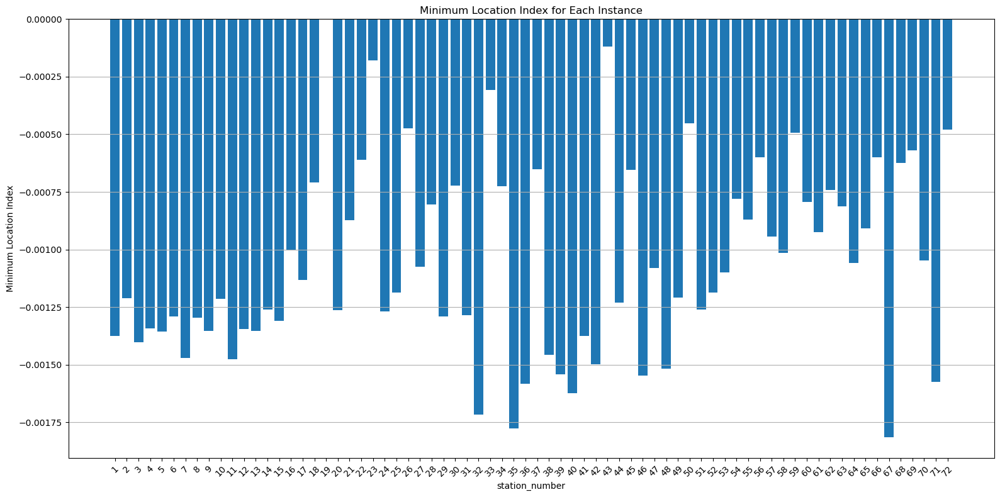

In [32]:
# Plotting SFI values
plt.figure(figsize=(16, 8))
plt.bar(df_min_SFI['station_number'], -df_min_SFI['min_SFI'])
plt.xlabel('station_number')
plt.ylabel('Minimum Location Index')
plt.title('Minimum Location Index for Each Instance')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.savefig("outcomes/police_station_min_SFI.png")
plt.show()

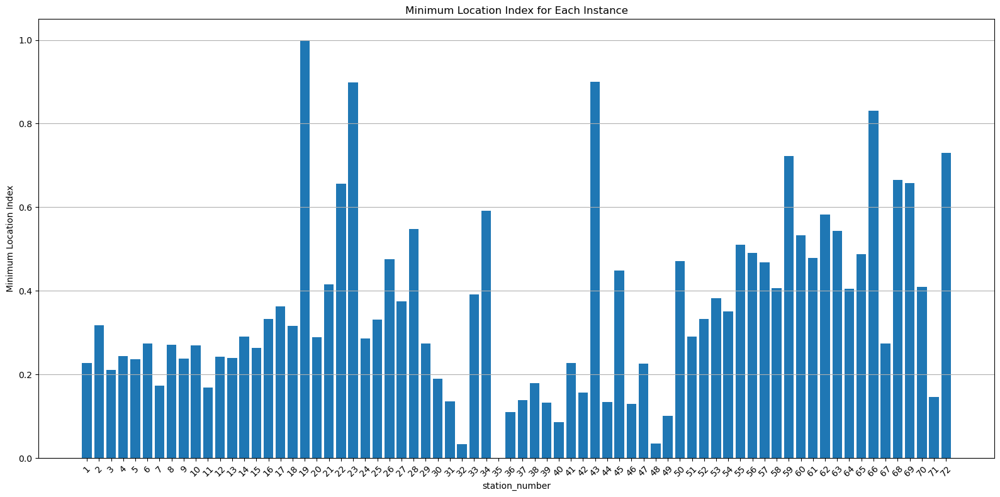

In [33]:
# Plotting SFI values
plt.figure(figsize=(16, 8))
plt.bar(df_min_SFI['station_number'], df_min_SFI['min_SFI_n_ps'])
plt.xlabel('station_number')
plt.ylabel('Minimum Location Index')
plt.title('Minimum Location Index for Each Instance')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
#plt.savefig("outcomes/police_station_min_SFI.png")
plt.show()

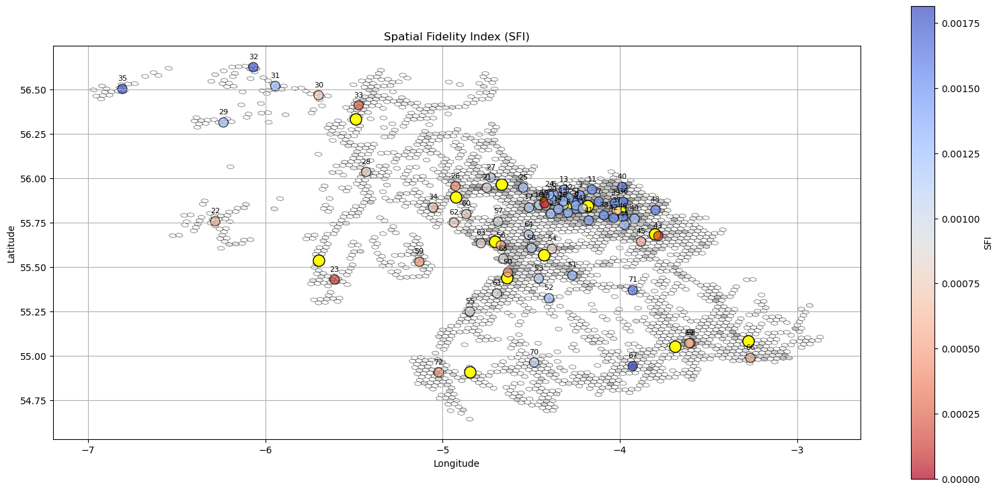

In [34]:
# Plotting SFI as scatter plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot hex bins with log point counts as color
gdf_hexbins.plot(ax=ax, column='log_point_count', 
                 cmap='Greys', legend=False, alpha=0.6, 
                 edgecolor='k', linewidth=0.5)


# Plot cluster centroids
gdf_centers.plot(ax=ax, color='yellow', markersize=150, label='Cluster Centers',
                edgecolors="k")


plt.scatter(df_min_SFI['longitude'], 
            df_min_SFI['latitude'], 
            c=df_min_SFI['min_SFI'], cmap='coolwarm_r', s=100, edgecolors='k', 
            alpha=0.7)

# Annotate points with station numbers
for i, txt in enumerate(df_min_SFI['station_number']):
    ax.annotate(txt, (df_min_SFI['longitude'].iloc[i], df_min_SFI['latitude'].iloc[i] + 0.04), 
                fontsize=8, fontweight=500, ha='center', va='bottom', color="black")


plt.colorbar(label='SFI', shrink=0.6)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Fidelity Index (SFI)')
plt.grid(True)
plt.tight_layout()

# Hexbins
plt.savefig("outcomes/geographical_min_SFI_index.png")
plt.show()

In [35]:
[p for p in police_stations if "_9" in p.simulation_name]

[PoliceStation(location=Location(x=55.84699895359203, y=-4.247957351656175), division='G', name='Gorbals, Glasgow', n_officers=75.0, simulation_name='station_9')]

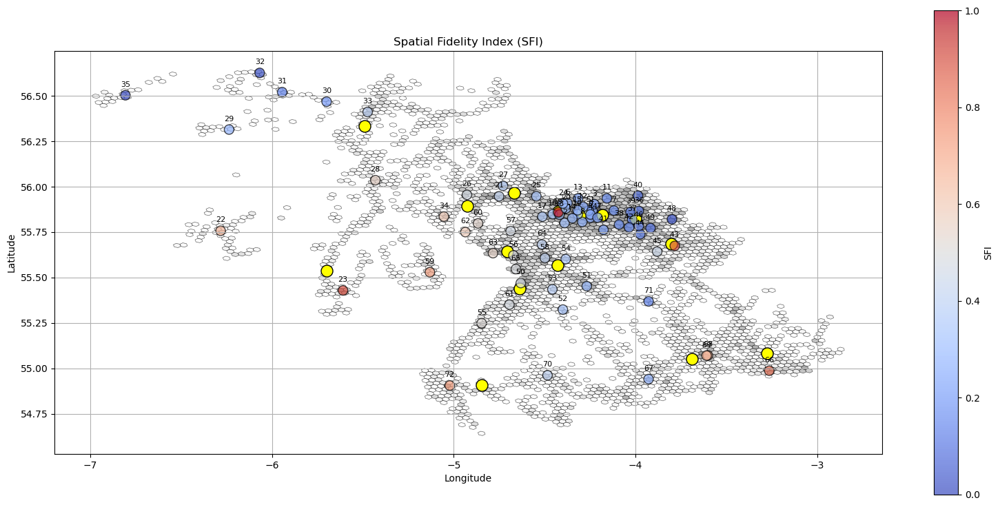

In [36]:
# Plotting SFI as scatter plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot hex bins with log point counts as color
gdf_hexbins.plot(ax=ax, column='log_point_count', 
                 cmap='Greys', legend=False, alpha=0.6, 
                 edgecolor='k', linewidth=0.5)


# Plot cluster centroids
gdf_centers.plot(ax=ax, color='yellow', markersize=150, label='Cluster Centers',
                edgecolors="k")


plt.scatter(df_min_SFI['longitude'], 
            df_min_SFI['latitude'], 
            c=df_min_SFI['min_SFI_n_ps'], cmap='coolwarm', s=100, edgecolors='k', 
            alpha=0.7)

# Annotate points with station numbers
for i, txt in enumerate(df_min_SFI['station_number']):
    ax.annotate(txt, (df_min_SFI['longitude'].iloc[i], df_min_SFI['latitude'].iloc[i] + 0.04), 
                fontsize=8, fontweight=500, ha='center', va='bottom', color="black")


plt.colorbar(label='SFI', shrink=0.6)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Fidelity Index (SFI)')
plt.grid(True)
plt.tight_layout()

# Hexbins
#plt.savefig("outcomes/geographical_min_SFI_index.png")
plt.show()

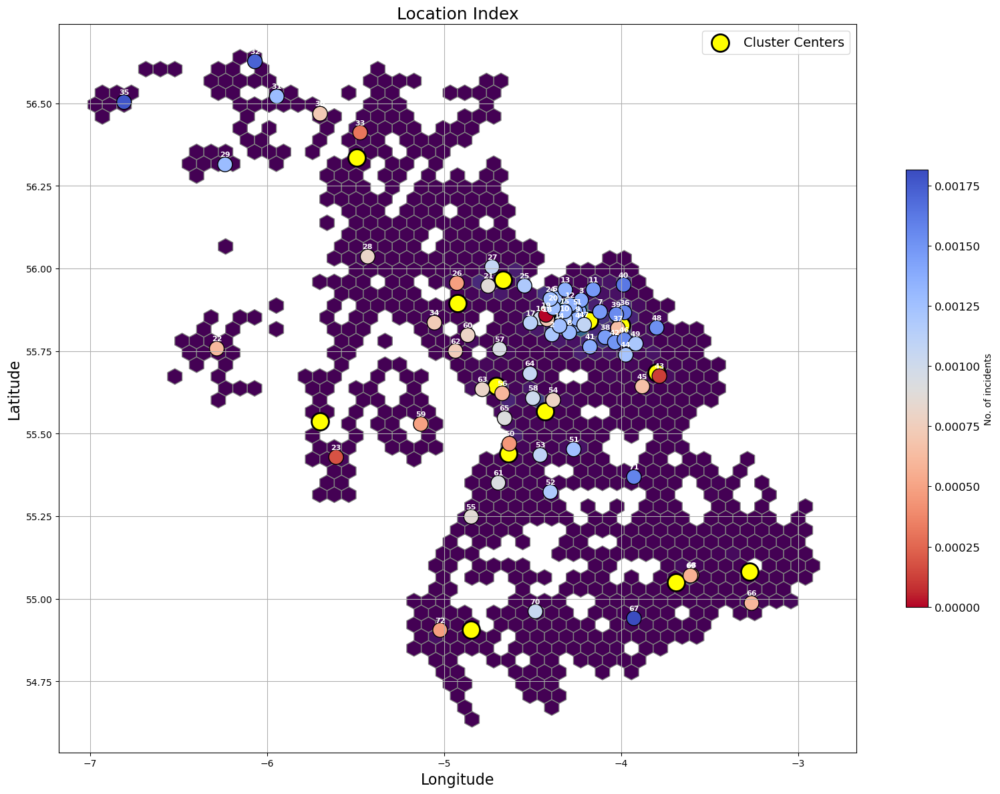

In [37]:
# Plotting SFI as scatter plot with adjusted sizes for readability
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], 
                gridsize=50, color="grey", mincnt=1, edgecolors='none',)

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)
plt.scatter(cluster_centers["longitude"], cluster_centers["latitude"],
            color='yellow', label='Cluster Centers', 
            edgecolor='black', linewidth=2, s=350)


# Scatter plot for SFI values
#scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], c=res_index_df_norm['service_provision_index'], cmap='coolwarm', s=200, edgecolors='k')
# Add colorbar with reduced size

# Annotate points with station numbers
#for i, txt in enumerate(res_index_df_norm['station_number']):
#    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="white")

# Scatter plot for SFI values
scatter = plt.scatter(df_min_SFI['longitude'], df_min_SFI['latitude'], c=df_min_SFI['min_SFI'], cmap='coolwarm_r', s=250, edgecolors='k')

cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='No. of incidents')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size


# Annotate points with station numbers
for i, txt in enumerate(df_min_SFI['station_number']):
    ax.annotate(txt, (df_min_SFI['longitude'].iloc[i], df_min_SFI['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="white")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Location Index', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/location_index_map.png")
# Show plot
plt.show()


### Catchment Areas

This is a potential metric that can be used to quanitfy the effective catchment area for which the service is provided. Uisng the effective mean distance to the resolved station. This provides a measure of how much area a police station is providing service for. 

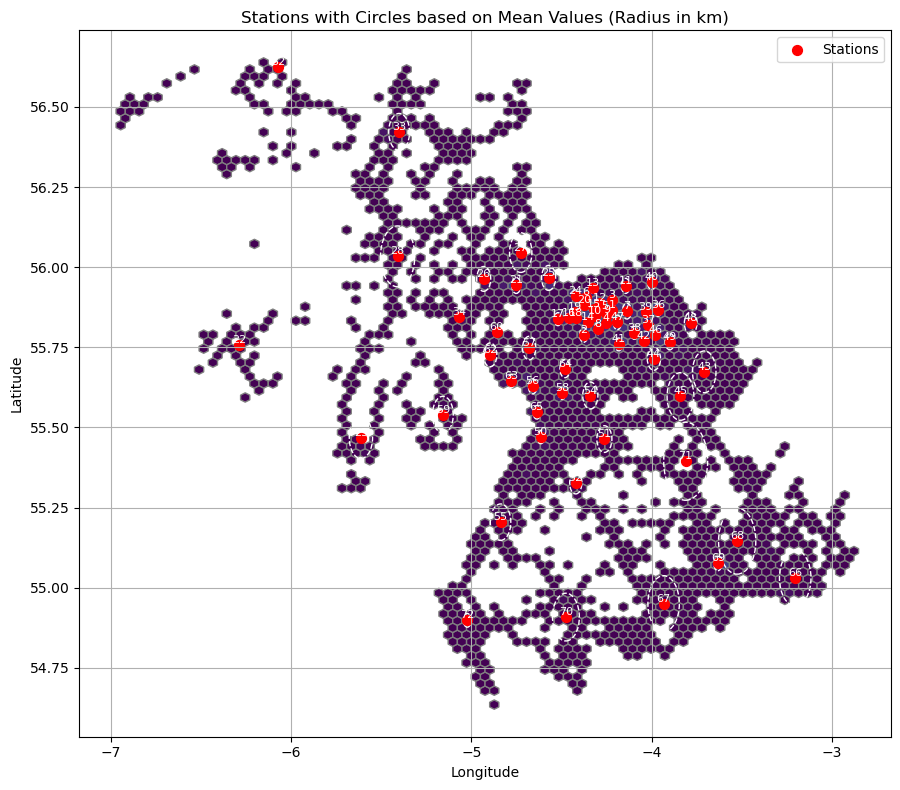

In [38]:
from shapely.geometry import Point
from matplotlib.patches import Circle
import math

# Group by station and calculate mean
station_means = simulation_data.groupby('police_station').mean()

# Convert kilometers to degrees of latitude and longitude
def km_to_deg_lat_lon(km, latitude):
    lat_degree_km = 111.0  # Approximate value at the equator
    lon_degree_km = lat_degree_km * abs(math.cos(math.radians(latitude)))
    deg_lat = km / lat_degree_km
    deg_lon = km / lon_degree_km
    return deg_lat, deg_lon

# Convert radius in kilometers to degrees
station_means['radius'] = station_means.apply(lambda row: km_to_deg_lat_lon(row[row.name], row['latitude'])[1], axis=1)

# Create a GeoDataFrame for plotting
geometry = [Point(xy) for xy in zip(station_means['longitude'], station_means['latitude'])]
gdf_stations = gpd.GeoDataFrame(station_means, geometry=geometry, crs="EPSG:4326")

# Plotting stations with circles based on mean values
fig, ax = plt.subplots(figsize=(12, 8))

hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')


# Plot circles for each station
for i, row in gdf_stations.iterrows():
    circle = Circle((row['longitude'], row['latitude']), 
                    radius=row['radius'],  # Use radius for both x and y axes
                    edgecolor='w', facecolor='none', linestyle='--')
    ax.add_patch(circle)

# Plotting stations as points
gdf_stations.plot(ax=ax, marker='o', color='red', markersize=50, label='Stations')

# Add labels for stations
for x, y, label in zip(gdf_stations.geometry.x, gdf_stations.geometry.y, gdf_stations.index):
    ax.text(x, y, label.replace("station_", ""), fontsize=8, ha='center', va='bottom', color="white")

# Set plot title and labels
plt.title('Stations with Circles based on Mean Values (Radius in km)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show plot
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("outcomes/geographical_catchement_area.png")
plt.show()

In [39]:
station_means

,latitude,longitude,day,hour,time,deployment_time,station_1,station_2,station_3,station_4,...,station_71,station_72,sno,resolved,allocation_time,response_time,resolution_time,nearest_cluster,radius,geometry
police_station,,,,,,,,,,,,,,,,,,,,,
station_1,55.867223,-4.217546,4.089623,12.698113,86.849057,3.747484,1.062218,8.183744,2.647572,2.982237,...,36.240576,73.542066,3526.957547,1.0,86.849057,86.884464,90.667355,6.943396,0.017055,POINT (-4.21755 55.86722)
station_10,55.848804,-4.316062,4.184397,13.631206,90.056738,3.444090,3.425312,4.491954,5.186814,3.008134,...,36.455654,70.799230,3645.872340,1.0,90.056738,90.081595,93.550542,1.049645,0.011967,POINT (-4.31606 55.84880)
station_11,55.941566,-4.144689,4.221053,13.252632,90.557895,4.842281,6.291352,13.726327,4.335519,8.863481,...,40.472067,79.401670,3683.347368,1.0,90.557895,90.606694,95.497773,9.947368,0.023550,POINT (-4.14469 55.94157)
station_12,55.888437,-4.284937,4.388158,12.328947,93.644737,2.993092,2.331190,7.379242,2.561859,4.379906,...,38.501486,73.788288,3828.947368,1.0,93.644737,93.668892,96.686140,1.000000,0.011641,POINT (-4.28494 55.88844)
station_13,55.934930,-4.326239,4.375000,12.150000,93.150000,3.306667,5.754521,9.673646,4.523038,7.958281,...,42.079272,76.151829,3762.475000,1.0,100.686226,100.721218,104.062877,1.875000,0.016884,POINT (-4.32624 55.93493)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
station_70,54.908123,-4.475469,4.153846,14.615385,90.307692,1.660897,67.140707,61.776319,69.537893,64.313131,...,38.673005,22.376898,3690.423077,1.0,90.307692,90.466116,92.285438,5.769231,0.074479,POINT (-4.47547 54.90812)
station_71,55.394428,-3.811335,4.102564,12.076923,86.538462,1.427350,37.433862,36.606316,39.356309,35.210151,...,7.678404,58.699032,3502.974359,1.0,86.538462,86.794408,88.477706,11.051282,0.121803,POINT (-3.81134 55.39443)
station_72,54.897974,-5.022434,4.270270,11.108108,89.594595,1.259910,73.841817,67.060567,76.160694,71.127750,...,54.114874,1.371395,3660.135135,1.0,85.378378,85.424092,86.729715,6.000000,0.021486,POINT (-5.02243 54.89797)


In [40]:
row.name

'station_9'

## Resolution Indices

This metric assess how many incidents are resolved in each station per officer. 

In [41]:
# Add resolution within time here
thresholds = {'Immediate': 1/12, # 5 minutes
              'Prompt': 2/3, # 40 minutes
              'Standard': 100, # basically no time limit
              "Other resolution": 100} # basically no time limit

# Convert thresholds dictionary to a Series for vectorized operations
threshold_series = pd.Series(thresholds)

# Calculate the time difference
simulation_data['time_taken_to_respond'] = simulation_data['response_time'] - simulation_data['allocation_time']

# Apply the threshold filter
simulation_data["resolved_within_time"] = simulation_data[resolved_filter]['time_taken_to_respond'] <= simulation_data[resolved_filter]['priority'].map(threshold_series)

In [42]:
# Group by station and priority_group, then calculate the mean of resolved_within_time
station_resolution_counts = simulation_data[resolved_filter].groupby(['police_station', 'priority'])['resolved_within_time'].mean().unstack(fill_value=0)

In [43]:
station_resolution_counts.head()

priority,Immediate,Other resolution,Prompt,Standard
police_station,,,,
station_1,1.000000,1.0,1.0,1.0
station_10,1.000000,1.0,1.0,1.0
station_11,0.807692,1.0,1.0,1.0
station_12,1.000000,1.0,1.0,1.0
station_13,1.000000,1.0,1.0,1.0


In [44]:
# Group by station and count occurrences
station_counts = simulation_data[resolved_filter].groupby(['police_station', 'priority'])["urn"].count().unstack()
station_counts

priority,Immediate,Other resolution,Prompt,Standard
police_station,,,,
station_1,42.0,13.0,138.0,19.0
station_10,28.0,9.0,92.0,12.0
station_11,26.0,4.0,54.0,11.0
station_12,33.0,3.0,106.0,10.0
station_13,8.0,4.0,25.0,3.0
...,...,...,...,...
station_70,7.0,3.0,14.0,2.0
station_71,14.0,3.0,21.0,1.0
station_72,12.0,2.0,57.0,3.0


In [45]:
names = []
latitudes = []
longitudes = []
n_officers_list = []
simulation_names = []
immediate_counts = []
prompt_counts = []
other_counts = []
immediate_within_time_count = []
prompt_within_time_count = []
other_within_time_count = []



# Iterate over stations and collect attributes
for station in police_stations:
    names.append(station.name)
    latitudes.append(station.location.x)  # Latitude
    longitudes.append(station.location.y)  # Longitude
    n_officers_list.append(station.n_officers)
    simulation_names.append(station.simulation_name)
    
    station_name = station.name  # Replace with the attribute that matches station name in simulation_data
    if station.simulation_name in station_counts.index:
        # Immediate values
        immediate_count_value = station_counts.loc[station.simulation_name, 'Immediate']
        immediate_counts.append(immediate_count_value)
        # Prompt values
        prompt_count_value = station_counts.loc[station.simulation_name, 'Prompt']
        prompt_counts.append(prompt_count_value)
        # Other values
        standard_count_value = station_counts.loc[station.simulation_name, 'Standard']
        other_res_count_value = station_counts.loc[station.simulation_name, 'Other resolution']
        other_counts.append(other_res_count_value+standard_count_value)
    
        # Within time
        # Immediate values
        immediate_wt_count_value = station_resolution_counts.loc[station.simulation_name, 'Immediate']
        immediate_within_time_count.append(immediate_wt_count_value)
        # Prompt values
        prompt_wt_count_value = station_resolution_counts.loc[station.simulation_name, 'Prompt']
        prompt_within_time_count.append(prompt_wt_count_value)
        # Other values
        standard_wt_count_value = station_resolution_counts.loc[station.simulation_name, 'Standard']
        other_res_wt_count_value = station_resolution_counts.loc[station.simulation_name, 'Other resolution']
        other_within_time_count.append((other_res_wt_count_value+standard_wt_count_value)/2)
    
    else:
        # IF not found
        immediate_counts.append(0)
        prompt_counts.append(0)
        other_counts.append(0)
        
        immediate_within_time_count.append(0)        
        prompt_within_time_count.append(0)                
        other_within_time_count.append(0)                

In [46]:
# Create a new DataFrame
res_index_df = pd.DataFrame({
    'name': names,
    'latitude': latitudes,
    'longitude': longitudes,
    'n_officers': n_officers_list,
    'simulation_name': simulation_names,
    'immediate_count': immediate_counts,
    'prompt_count': prompt_counts,
    'other_count': other_counts,
    'station_number': [str(instance.simulation_name.replace("station_","")) for instance in police_stations],
    'immediate_within_time_count':immediate_within_time_count,
    'prompt_within_time_count':prompt_within_time_count,
    'other_within_time_count':other_within_time_count
})

res_index_df["min_SFI"] = df_min_SFI["min_SFI"]

# Create a dictionary mapping from index to 'Location Category' in estates_df
index_to_location_category = estates_df['Location Category (A=Urban, B=Rural, C=Remote, D=Islands)'].to_dict()

# Add a new column to res_index_df by mapping indices to the 'Location Category'
res_index_df['Location Category'] = res_index_df.index.map(index_to_location_category)
category_mapping = {
    'A': 'Urban',
    'B': 'Rural',
    'C': 'Remote',
    'D': 'Islands'
}

# Replace the codes with descriptions
res_index_df['Location Category'] = res_index_df['Location Category'].replace(category_mapping)


In [47]:
res_index_df.head()

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,prompt_within_time_count,other_within_time_count,min_SFI,Location Category
0,"Baird Street, Glasgow",55.869542,-4.236984,153.0,station_1,42.0,138.0,32.0,1,1.000000,1.0,1.0,0.001374,Urban
1,Barrhead,55.799930,-4.390426,37.0,station_2,13.0,68.0,10.0,2,0.769231,1.0,1.0,0.001211,Urban
2,Bishopbriggs,55.903822,-4.226463,4.0,station_3,11.0,32.0,13.0,3,1.000000,1.0,1.0,0.001403,Urban
3,"Cathcart, Glasgow",55.829003,-4.248148,117.0,station_4,37.0,104.0,29.0,4,1.000000,1.0,1.0,0.001343,Urban
4,Cowcaddens,55.868494,-4.257927,89.0,station_5,77.0,248.0,37.0,5,1.000000,1.0,1.0,0.001357,Urban


In [48]:
res_index_df["imm_res_per_officer"] = res_index_df["immediate_count"]/res_index_df["n_officers"]
res_index_df["pro_res_per_officer"] = res_index_df["prompt_count"]/res_index_df["n_officers"]
res_index_df["other_res_per_officer"] = res_index_df["other_count"]/res_index_df["n_officers"]

In [49]:
# Find the locations of infinite values
infinite_locations = res_index_df.replace([np.inf, -np.inf], np.nan).isna()

# Print the locations of infinite values
infinite_indices = infinite_locations[infinite_locations].stack().index.tolist()

if infinite_indices:
    print("Infinite values are located at:")
    for idx in infinite_indices:
        print(idx)
else:
    print("No infinite values found in res_index_df.")

Infinite values are located at:
(21, 'immediate_count')
(21, 'other_count')
(21, 'imm_res_per_officer')
(21, 'other_res_per_officer')
(27, 'other_count')
(27, 'other_res_per_officer')
(31, 'other_count')
(31, 'other_res_per_officer')
(33, 'other_count')
(33, 'other_res_per_officer')
(39, 'other_count')
(39, 'other_res_per_officer')
(52, 'imm_res_per_officer')
(52, 'pro_res_per_officer')
(52, 'other_res_per_officer')
(53, 'other_count')
(53, 'other_res_per_officer')
(54, 'other_count')
(54, 'other_res_per_officer')
(58, 'other_count')
(58, 'other_res_per_officer')
(60, 'imm_res_per_officer')
(60, 'pro_res_per_officer')
(60, 'other_res_per_officer')
(61, 'other_count')
(61, 'other_res_per_officer')


In [50]:
res_index_df.iloc[[52, 60]]

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,prompt_within_time_count,other_within_time_count,min_SFI,Location Category,imm_res_per_officer,pro_res_per_officer,other_res_per_officer
52,Drongan,55.435152,-4.457434,0.0,station_53,0.0,0.0,0.0,53,0.0,0.0,0.0,0.001098,Urban,NaN,NaN,NaN
60,Maybole (new),55.350963,-4.694089,0.0,station_61,0.0,0.0,0.0,61,0.0,0.0,0.0,0.000925,Urban,NaN,NaN,NaN


In [51]:
# Normalise everything
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
res_index_df_norm = res_index_df.copy()
res_index_df_norm = res_index_df_norm[res_index_df_norm["n_officers"]!=0]
norm_columns = ['imm_res_per_officer', "pro_res_per_officer", "other_res_per_officer", "immediate_count", "prompt_count", "other_count", "immediate_within_time_count", "prompt_within_time_count", "other_within_time_count"]
res_index_df_norm[norm_columns] = scaler.fit_transform(res_index_df_norm[norm_columns])
res_index_df_norm["neg_min_SFI"] = -res_index_df_norm["min_SFI"]
res_index_df_norm["neg_min_SFI"] = scaler.fit_transform(res_index_df_norm[["neg_min_SFI"]])
df_melted = res_index_df_norm.melt(id_vars='station_number', value_vars=['imm_res_per_officer', "pro_res_per_officer", "other_res_per_officer", 'neg_min_SFI'],
                              var_name='Metric', value_name='Value')



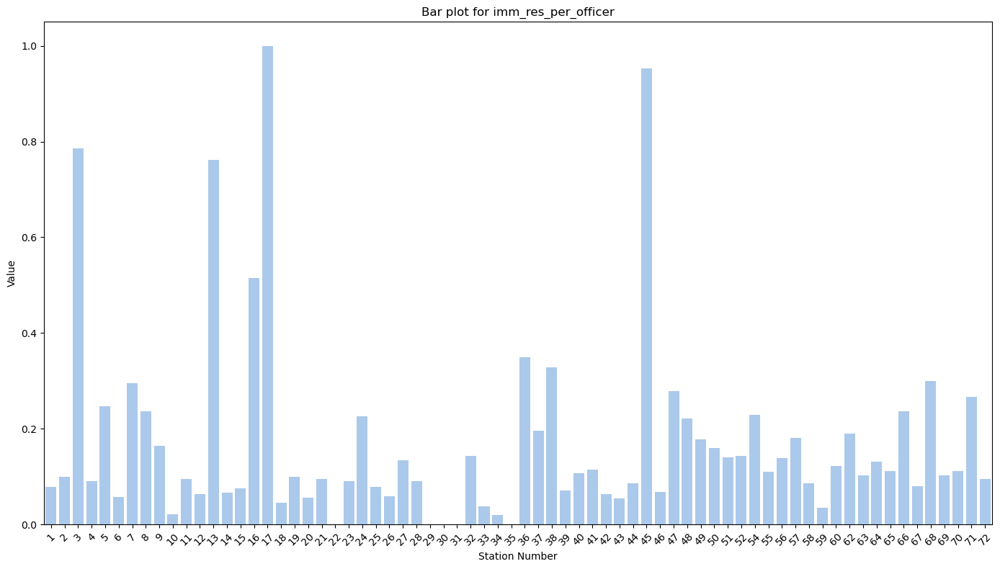

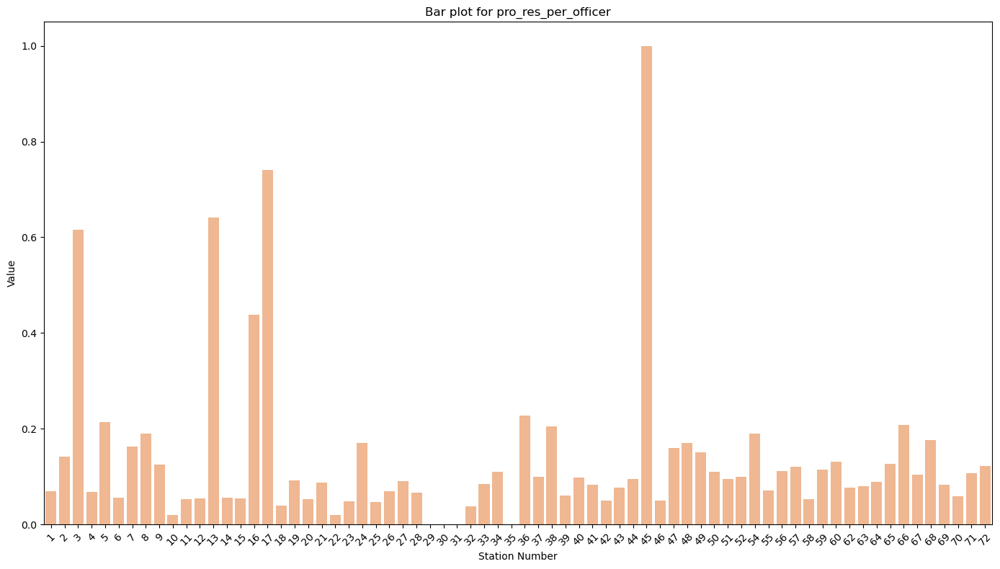

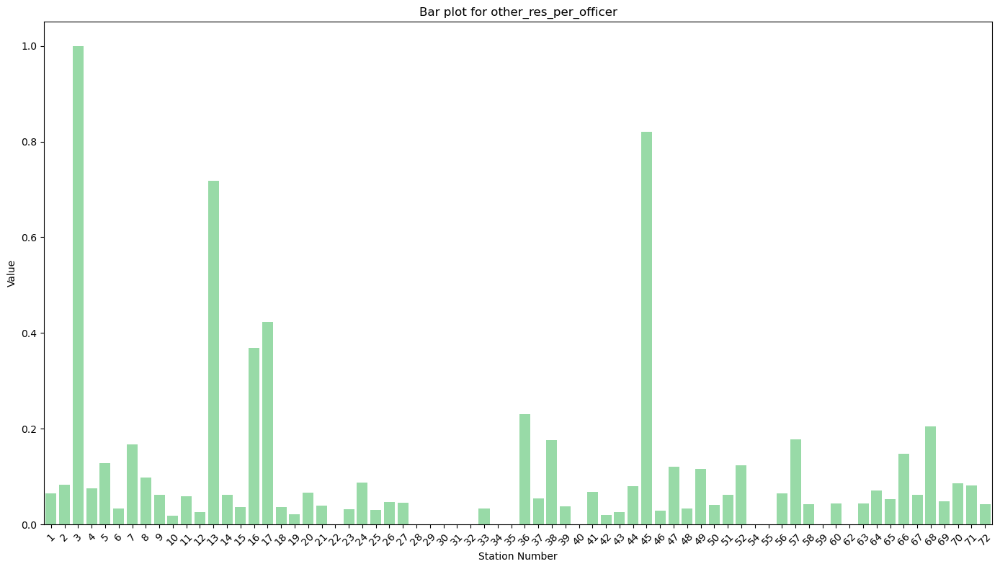

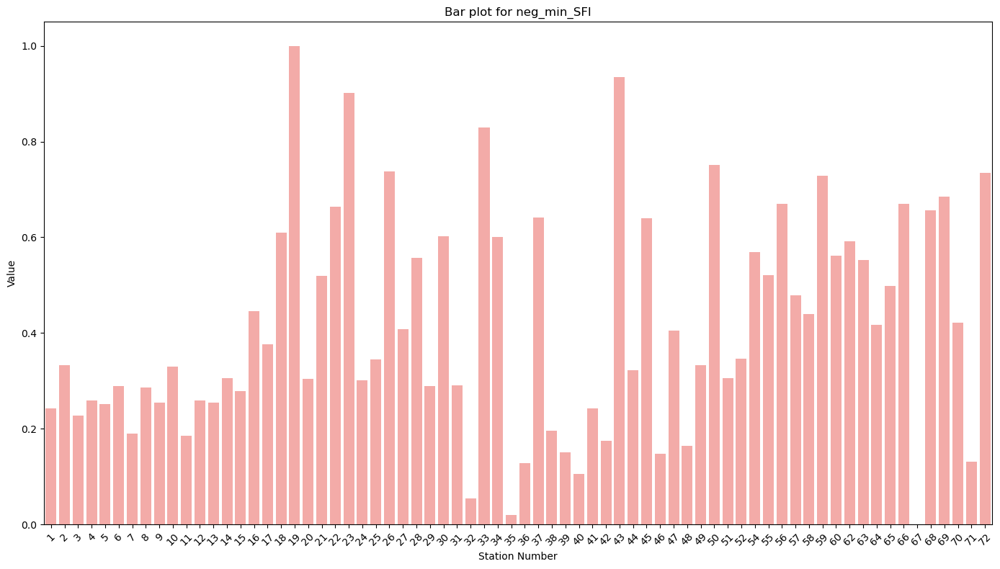

In [52]:
# Get unique metrics
metrics = df_melted['Metric'].unique()

# Generate pastel color palette
palette = sns.color_palette('pastel', len(metrics))

# Map each metric to a color
metric_colors = dict(zip(metrics, palette))

# Plot for each metric
for metric in metrics:
    plt.figure(figsize=(14, 8))
    metric_data = df_melted[df_melted['Metric'] == metric]
    sns.barplot(x='station_number', y='Value', data=metric_data, color=metric_colors[metric])
    plt.title(f'Bar plot for {metric}')
    plt.xlabel('Station Number')
    plt.ylabel('Value')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Service Provision Index

This takes into account the three main factors - 
* Location / Police Protection Coverage (69.1%)
* Resolution of Incidents (Count) (9.1%)
  * Immediate (70.8%)
  * Propmpt (23.1%)
  * Other (6.0%)
* Resolution of Incidents on Time (Precentage) (21.8%)
  * Immediate (74.3%)
  * Prompt (19.4%)
  * Other (6.3%)

In [53]:
res_index_df_norm.loc[res_index_df_norm["other_count"].isnull(), "other_count"] = 0
res_index_df_norm.loc[res_index_df_norm["immediate_count"].isnull(), "immediate_count"] = 0
res_index_df_norm.loc[res_index_df_norm["prompt_count"].isnull(), "prompt_count"] = 0

In [54]:
res_index_df_norm.loc[res_index_df_norm["imm_res_per_officer"].isnull(), "imm_res_per_officer"] = 0
res_index_df_norm.loc[res_index_df_norm["other_res_per_officer"].isnull(), "other_res_per_officer"] = 0
res_index_df_norm.loc[res_index_df_norm["pro_res_per_officer"].isnull(), "pro_res_per_officer"] = 0

In [55]:
# Calculating Service Provision Index

def calculate_service_provision_index(df):
    
    # Resolution of Incidents score
    res_imm_score= df["imm_res_per_officer"]*0.708
    res_pro_score= df["pro_res_per_officer"]*0.231
    res_other_score= df["other_res_per_officer"]*0.06
    res_score = (res_imm_score + res_pro_score + res_other_score) * 0.371
    
    # Resolution of Incidents on Time score
    res_imm_time_score= df["immediate_within_time_count"]*0.743
    res_pro_time_score= df["prompt_within_time_count"]*0.194
    res_other_time_score= df["other_within_time_count"]*0.063
    res_time_score = (res_imm_time_score + res_pro_time_score + res_other_time_score) * 0.629

    return res_score + res_time_score

res_index_df_norm["service_provision_index"] = calculate_service_provision_index(res_index_df_norm)

In [56]:
res_index_df_norm.head()

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,prompt_within_time_count,other_within_time_count,min_SFI,Location Category,imm_res_per_officer,pro_res_per_officer,other_res_per_officer,neg_min_SFI,service_provision_index
0,"Baird Street, Glasgow",55.869542,-4.236984,153.0,station_1,0.545455,0.556452,0.864865,1,1.000000,1.0,1.0,0.001374,Urban,0.078431,0.069382,0.064354,0.242646,0.656980
1,Barrhead,55.799930,-4.390426,37.0,station_2,0.168831,0.274194,0.270270,2,0.769231,1.0,1.0,0.001211,Urban,0.100386,0.141372,0.083160,0.332441,0.561486
2,Bishopbriggs,55.903822,-4.226463,4.0,station_3,0.142857,0.129032,0.351351,3,1.000000,1.0,1.0,0.001403,Urban,0.785714,0.615385,1.000000,0.226827,0.910381
3,"Cathcart, Glasgow",55.829003,-4.248148,117.0,station_4,0.480519,0.419355,0.783784,4,1.000000,1.0,1.0,0.001343,Urban,0.090354,0.068376,0.076266,0.259679,0.660291
4,Cowcaddens,55.868494,-4.257927,89.0,station_5,1.000000,1.000000,1.000000,5,1.000000,1.0,1.0,0.001357,Urban,0.247191,0.214347,0.127917,0.252326,0.715146


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


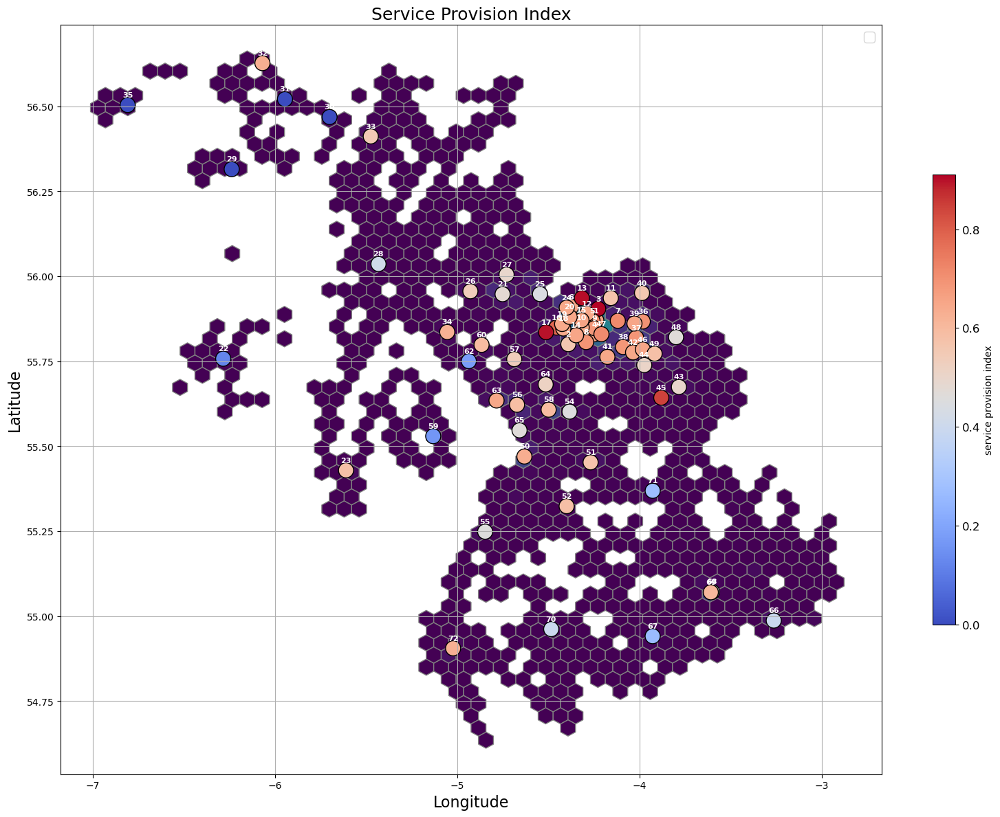

In [57]:
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=50, color="grey", mincnt=1, edgecolors='none')

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)

# Scatter plot for SFI values
scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], c=res_index_df_norm['service_provision_index'], cmap='coolwarm', s=250, edgecolors='k')

# Add colorbar with reduced size
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='service provision index')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
for i, txt in enumerate(res_index_df_norm['station_number']):
    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="white")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Service Provision Index', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/service_provision_index_map.png")
# Show plot
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


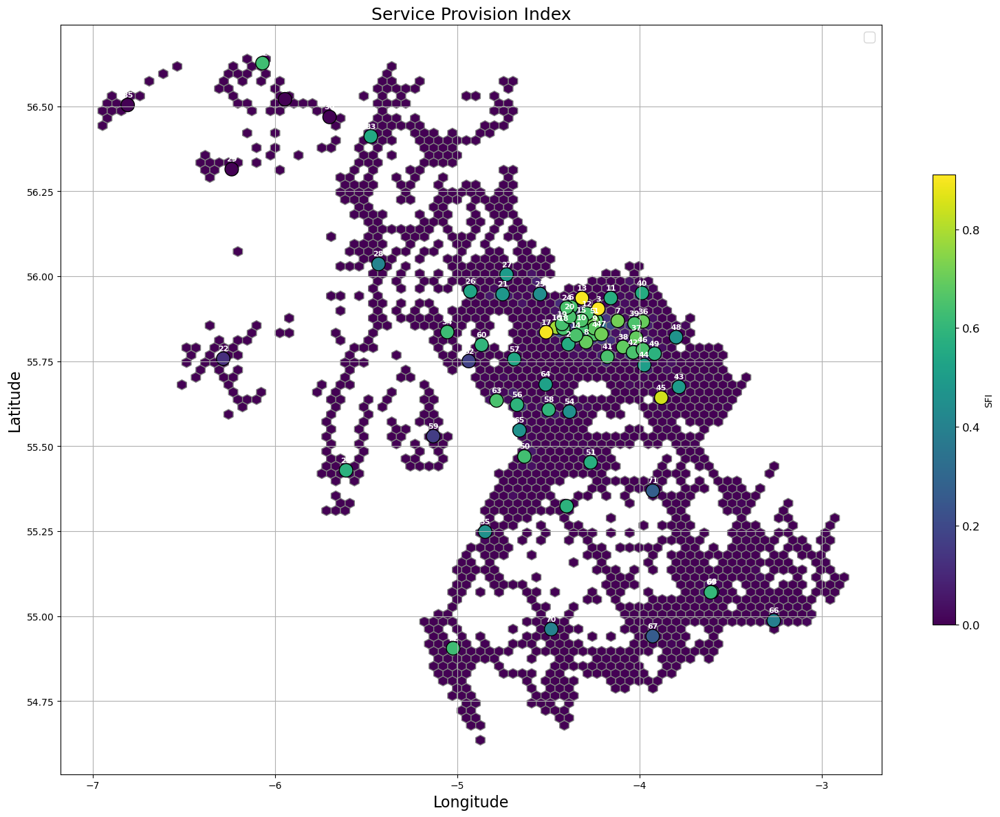

In [58]:
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)

# Scatter plot for SFI values
# Define the color mapping for each Location Category
category_colors = {
    'Urban': 'red',
    'Rural': 'green',
    'Remote': 'blue',
    'Islands': 'purple'
}

# Map the Location Category to colors
colors = res_index_df_norm['Location Category'].map(category_colors)

# Create the scatter plot
scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], 
                     c=res_index_df_norm["service_provision_index"],
                     s=200, edgecolors='k')

# Add colorbar with reduced size
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='SFI')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
for i, txt in enumerate(res_index_df_norm['station_number']):
    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="white")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Service Provision Index', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

#plt.savefig("outcomes/location_index_map.png")
# Show plot
plt.show()


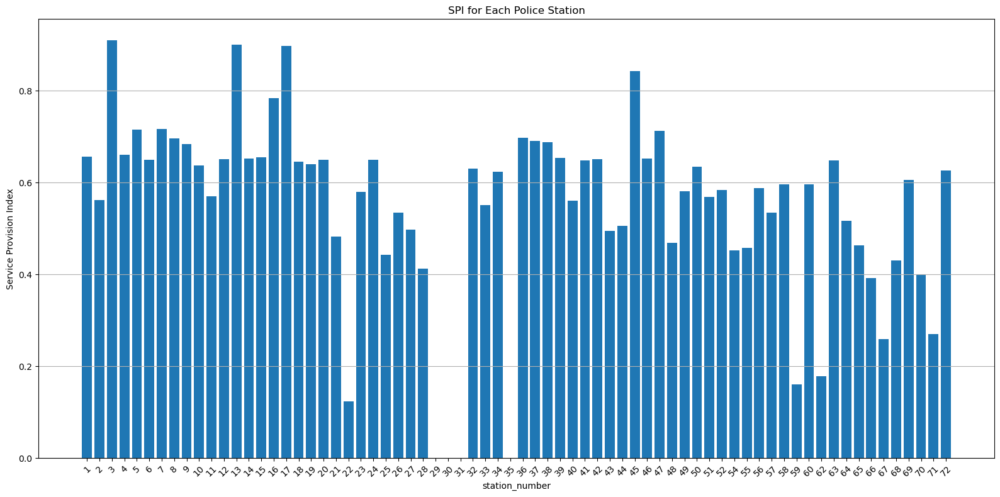

In [59]:
# Plotting SFI values
plt.figure(figsize=(16, 8))
plt.bar(res_index_df_norm['station_number'], res_index_df_norm["service_provision_index"])
plt.xlabel('station_number')
plt.ylabel('Service Provision Index')
plt.title('SPI for Each Police Station')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.savefig("outcomes/service_provision_index_bar_chart.png")
plt.show()

In [60]:
res_index_df["min_SFI"].max(), res_index_df["min_SFI"].min()

(0.001814564890349283, 0.0)

In [61]:
res_index_df_norm["neg_min_SFI"].max(), res_index_df_norm["neg_min_SFI"].min()

(0.9999999999999999, 0.0)

In [62]:
res_index_df_norm["Location Category"].unique()

array(['Urban'], dtype=object)

## Infrastucture and Costs Metric

In [63]:
# Firstly combine the two versions of estates df
# To get the information about finances while retaining
# the new Deployment data
estates_df = load_estates_df("data/Estate_Informationv3.xlsx")

In [64]:
# Cleaning column - Condition Grade
estates_df['Condition Grade'] = estates_df['Condition Grade'].replace(
    ['Not Surveyed', 'Not yet undertaken', 'Not surveyed', 'No grade available', np.nan],
    np.nan
)

# Cleaning column - Ownership
estates_df["Ownership"] = estates_df["Ownership"].replace(
['Leased In', 'Leased in'], "Leased In")

# Cleaning the Property Size column
estates_df["Property Size GIA sq.m"] = estates_df["Property Size GIA sq.m"].replace(
['TBC', 'Variable'], np.nan)

# Cleaning column - Year of Construction
def clean_year_value(year):
    if pd.isna(year) or year in ['Unknown', 'No survey available', 'no info.']:
        return np.nan
    elif year == "1900s / 1995":
        year = 1995
    elif isinstance(year, str):
        year = year.lower().strip()
        if 'circa' in year or 'c.' in year:
            year = year.replace('circa', '').replace('c.', '').replace("'", '').replace('s', '').strip()
        if 'refurbished' in year:
            year = year.split(' ')[-1]  # Take the year after 'refurbished'
        if '/' in year:
            parts = year.split('/')
            year = str(int(sum(int(part.strip()) for part in parts) / len(parts)))  # Average the years
        if 'post' in year.lower():
            year = '1945'
        if 's' in year:
            year = year.replace('s', '')
        year = year.replace('+', '').replace("'", '').replace(' ', '')
    try:
        return int(year)
    except ValueError:
        return np.nan

# Year
estates_df["Year of Construction"] = estates_df["Year of Construction"].apply(clean_year_value)



#no_condition_filter = estates_df["Condition Grade"].isna()
#estates_df.loc[no_condition_filter]

In [65]:
# Filters
police_station_filter = estates_df["Property Classification"] == "Police Station"
local_policing_filter = estates_df["Primary Classification (Use)"] == "Local Policing"
deployment_filter = estates_df["Deployment station? Y/N"] == "Yes"
estates_df = estates_df[police_station_filter & local_policing_filter & deployment_filter]

## Costs

In [66]:
estates_df.head()

,Activity code,Property Classification,Record Level,Division Name,Division,Unitary Authority,Site Name,Property Name,X (Easting),Y (Northing),...,Mountain Rescue (Yes / No),Dogs / Horses (Yes / No),Fleet workshop (Yes / No),Mortuary (Yes / No),Stores (Yes / No),Critical IT infrastructure (Yes / No),Accommodation (Yes / No),Intelligence Support (Yes / No),Number of Parking Spaces,EV Infrastructure
2,P0926,Police Station,Building,Greater Glasgow,G,Glasgow City Council,"Baird Street, Glasgow",Baird Street Police station,260122,666304,...,No,No,No,No,No,NaN,No,Yes,113.0,4
5,P1302,Police Station,Building,Greater Glasgow,G,East Renfrewshire Council,Barrhead,Barrhead Police station,250255,658880,...,No,No,No,No,No,NaN,No,No,14.0,0
7,P0902,Police Station,Building,Greater Glasgow,G,East Dunbartonshire Council,Bishopbriggs,Bishopbriggs Police station,260903,670097,...,No,No,No,No,No,NaN,No,No,12.0,0
12,P0925,Police Station,Building,Greater Glasgow,G,Glasgow City Council,"Cathcart, Glasgow",Cathcart Police station (stewart street),259277,661816,...,No,No,No,No,No,NaN,No,Yes,70.0,4
16,P0905,Police Station,Building,Greater Glasgow,G,Glasgow City Council,Cowcaddens,Glasgow City Centre Police station,258808,666230,...,No,No,No,No,No,NaN,No,No,58.0,3


In [67]:
estates_df = estates_df[estates_df["Total Headcount"] > 0]

The column "Total 22-23 Running Costs" is the sum of all the running cost columns listed here - 

costs_columns = [
           "Rent", "Property Service Charge", "Non Domestic Rates",
           'Gas (£)', 'Electricity',
           'Heating Fuel Oil & Solid Fuel', 'Water Rates & Sewarage',
           'Fixtures & Fittings', 'Repairs & Maintenance', 'Cleaning',
           'Manned Guard/Security', 'Soft Fm Contract Mgt fee',
           'Other property costs', 'Miscellaneous Costs'
           ]

In [68]:
# Cost columns
cost_columns = ["Total 22-23 Running Costs", 
           "Property Size GIA sq.m",
           "Rent", "Property Service Charge", "Non Domestic Rates",
           'Gas (£)', 'Electricity',
           'Heating Fuel Oil & Solid Fuel', 'Water Rates & Sewarage',
           'Fixtures & Fittings', 'Repairs & Maintenance', 'Cleaning',
           'Manned Guard/Security', 'Soft Fm Contract Mgt fee',
           'Other property costs', 'Miscellaneous Costs',
           'Total Headcount', 'Custody Yes/No',
           ]

<Axes: xlabel='Total Headcount', ylabel='Total 22-23 Running Costs'>

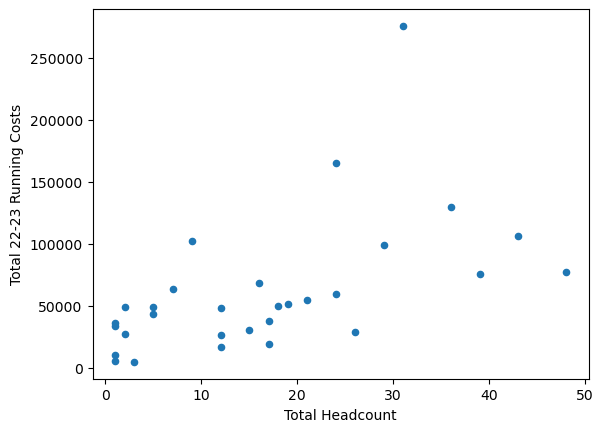

In [69]:
low_head_count = estates_df["Total Headcount"] < 50
estates_df.loc[low_head_count, ["Total 22-23 Running Costs", "Property Size GIA sq.m", "Total Headcount"]].plot.scatter(x="Total Headcount", 
                                                                                                 y="Total 22-23 Running Costs")

<Axes: xlabel='Property Size GIA sq.m', ylabel='Total 22-23 Running Costs'>

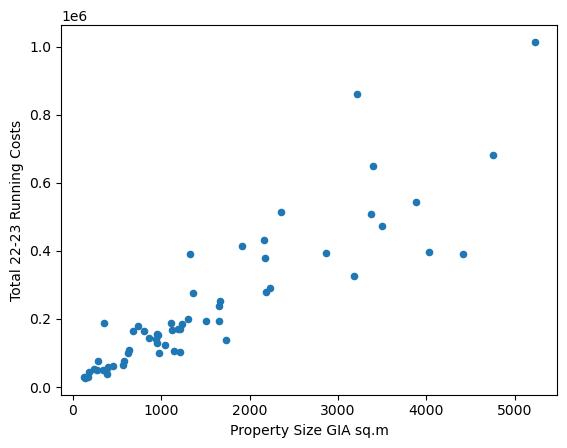

In [70]:
low_property_size = estates_df["Property Size GIA sq.m"] > 100
estates_df.loc[low_property_size, ["Total 22-23 Running Costs", "Property Size GIA sq.m", "Total Headcount"]].plot.scatter(x="Property Size GIA sq.m", 
                                                                                                   y="Total 22-23 Running Costs")

<Axes: xlabel='Property Size GIA sq.m', ylabel='Total 22-23 Running Costs'>

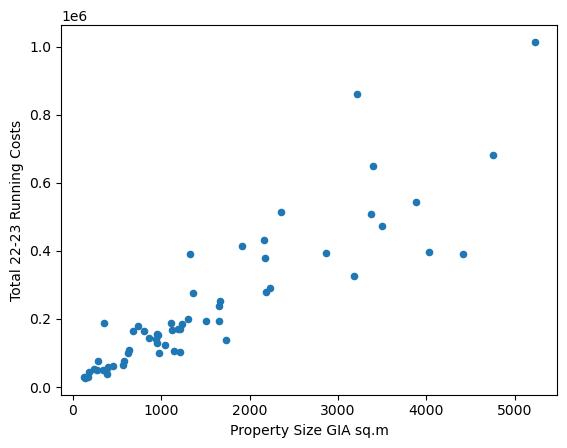

In [71]:
estates_df.loc[low_property_size, ["Total 22-23 Running Costs", "Property Size GIA sq.m", "Total Headcount"]].plot.scatter(x="Property Size GIA sq.m", 
                                                                                                   y="Total 22-23 Running Costs")

In [72]:
# Assuming due to economies of scale
# There is a constant rate of increase
# However there is a standard base cost
# Discounting this base cost from the
# Running costs would give a more sensible
# etimate

from sklearn.linear_model import LinearRegression

#low_values = (estates_df["Total Headcount"] < 10) & (estates_df["Property Size GIA sq.m"] < 100)
low_values = estates_df.index

X_headcount = estates_df.loc[low_values, "Total Headcount"].values.reshape(-1, 1)
X_size = estates_df.loc[low_values, "Property Size GIA sq.m"].values.reshape(-1, 1)
y = estates_df.loc[low_values, "Total 22-23 Running Costs"].values

In [73]:
# Linear regression model for Total Running Costs vs Total Headcount
model_headcount = LinearRegression()
model_headcount.fit(X_headcount, y)
m_headcount = model_headcount.coef_[0]
c_headcount = model_headcount.intercept_

print(f"{m_headcount=} {c_headcount=}")

m_headcount=1703.4129352125497 c_headcount=33916.60269419657


In [74]:
# Linear regression model for Total Running Costs vs Property Size
model_size = LinearRegression()
model_size.fit(X_size, y)
m_size = model_size.coef_[0]
c_size = model_size.intercept_

print(f"{m_size=} {c_size=}")

m_size=146.20728342119085 c_size=15693.239630384924


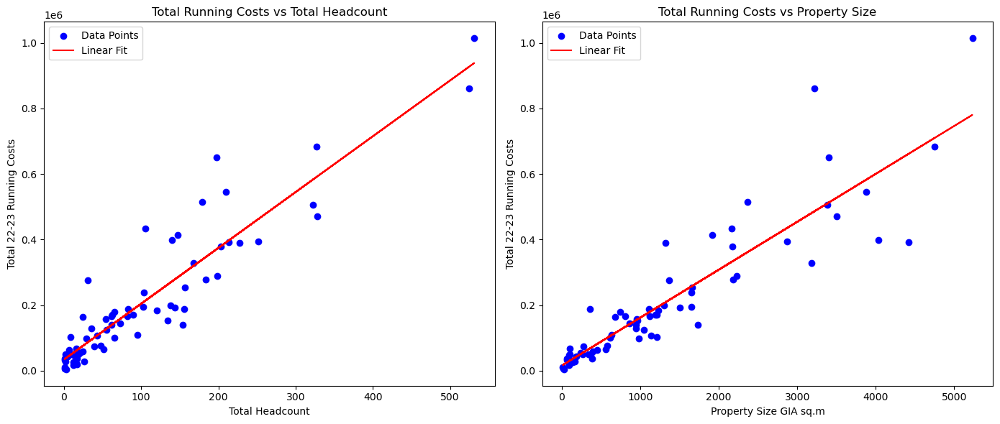

In [75]:
# Plotting the linear fit for Total Running Costs vs Total Headcount
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.scatter(estates_df["Total Headcount"], estates_df["Total 22-23 Running Costs"], color='blue', label='Data Points')
plt.plot(estates_df["Total Headcount"], model_headcount.predict(estates_df["Total Headcount"].values.reshape(-1, 1)), color='red', label='Linear Fit')
plt.title("Total Running Costs vs Total Headcount")
plt.xlabel("Total Headcount")
plt.ylabel("Total 22-23 Running Costs")
plt.legend()

# Plotting the linear fit for Total Running Costs vs Property Size
plt.subplot(1, 2, 2)
plt.scatter(estates_df["Property Size GIA sq.m"], estates_df["Total 22-23 Running Costs"], color='blue', label='Data Points')
plt.plot(estates_df["Property Size GIA sq.m"], model_size.predict(estates_df["Property Size GIA sq.m"].values.reshape(-1, 1)), color='red', label='Linear Fit')
plt.title("Total Running Costs vs Property Size")
plt.xlabel("Property Size GIA sq.m")
plt.ylabel("Total 22-23 Running Costs")
plt.legend()

plt.tight_layout()
plt.show()

In [76]:
# Prepare the data for multiple linear regression
X = estates_df.loc[low_values, ["Total Headcount", "Property Size GIA sq.m"]]
y = estates_df.loc[low_values, "Total 22-23 Running Costs"]

# Initialize and fit the multiple linear regression model
multiple_linear_model = LinearRegression()
multiple_linear_model.fit(X, y)

# Extract the coefficients and intercept
coefficients = multiple_linear_model.coef_
intercept = multiple_linear_model.intercept_

coefficients, intercept

(array([1039.5166015,   67.8223395]), 12721.592320270662)

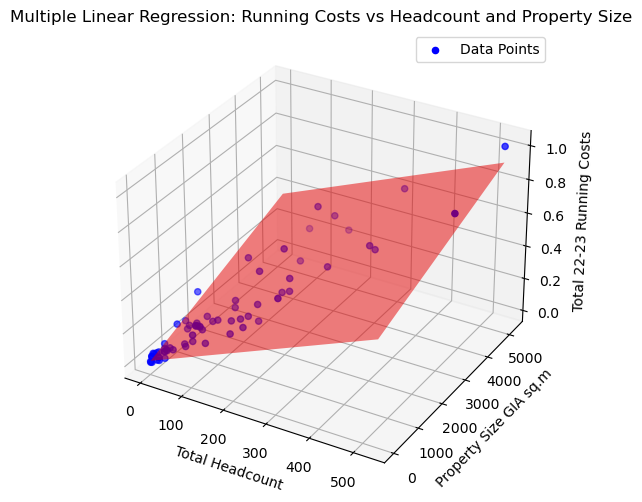

In [77]:

# Assuming you have the fitted model and the data
headcount_range = np.linspace(estates_df["Total Headcount"].min(), estates_df["Total Headcount"].max(), 10)
size_range = np.linspace(estates_df["Property Size GIA sq.m"].min(), estates_df["Property Size GIA sq.m"].max(), 10)
headcount_mesh, size_mesh = np.meshgrid(headcount_range, size_range)
costs_mesh = multiple_linear_model.predict(np.c_[headcount_mesh.ravel(), size_mesh.ravel()]).reshape(headcount_mesh.shape)

# Plotting
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(estates_df["Total Headcount"], estates_df["Property Size GIA sq.m"], estates_df["Total 22-23 Running Costs"], color='blue', label='Data Points')
ax.plot_surface(headcount_mesh, size_mesh, costs_mesh, color='red', alpha=0.5, rstride=100, cstride=100)

# Labels and title
ax.set_xlabel('Total Headcount')
ax.set_ylabel('Property Size GIA sq.m')
ax.set_zlabel('Total 22-23 Running Costs')
ax.set_title('Multiple Linear Regression: Running Costs vs Headcount and Property Size')

plt.legend()
plt.show()

In [78]:
estates_df["Total Headcount"].max(), estates_df["Total Headcount"].min()

(531.0, 1.0)

In [79]:
estates_df["Property Size GIA sq.m"].max(), estates_df["Property Size GIA sq.m"].min()

(5230.0, 13.0)

In [80]:
estates_df[["Total 22-23 Running Costs", "Total Headcount", "Property Size GIA sq.m"]].sort_values("Total 22-23 Running Costs")

,Total 22-23 Running Costs,Total Headcount,Property Size GIA sq.m
135,4591,3.0,30.0
98,5243.34,1.0,16.0
95,10551.47,1.0,13.0
154,16720.26,12.0,91.0
172,18996.4,17.0,92.0
...,...,...,...
16,544446.34,210.0,3882.0
73,650790.56,198.0,3400.0
67,682813.12,327.0,4751.0
136,861985.57,524.0,3215.0


In [81]:
(estates_df["Total 22-23 Running Costs"]).sort_values()

135          4591
98        5243.34
95       10551.47
154      16720.26
172       18996.4
          ...    
16      544446.34
73      650790.56
67      682813.12
136     861985.57
34     1013937.62
Name: Total 22-23 Running Costs, Length: 70, dtype: object

#### Plot of Running Costs Minus Base Cost vs Total Headcount

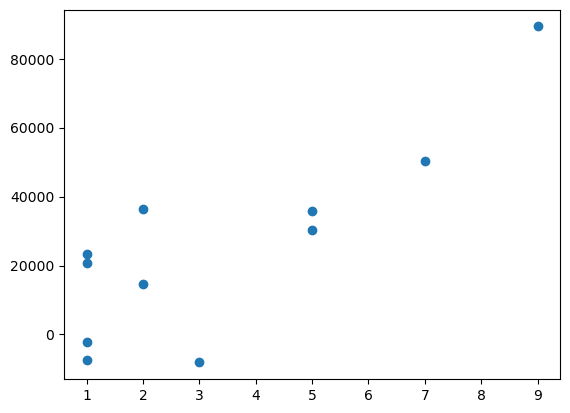

In [82]:
d = estates_df[estates_df["Total Headcount"] < 10]
plt.scatter(x=d["Total Headcount"], y=d["Total 22-23 Running Costs"] - intercept)

In [83]:
# Calculate the cost emtric
non_zero_head_count = estates_df["Total Headcount"] != 0
estates_df = estates_df[non_zero_head_count]
estates_df_copy = estates_df.copy()
estates_df_copy = estates_df_copy.rename(columns={"Site Name":"name"})


# Cost index = 
# (running_costs - intercept)/(property_size * head_count)
lin_reg_costs = estates_df["Total Headcount"] * coefficients[0] + estates_df["Property Size GIA sq.m"] * coefficients[1] + intercept
estates_df_copy["cost_index"] = (estates_df["Total 22-23 Running Costs"] - c_size) / (estates_df["Property Size GIA sq.m"])
estates_df_copy["cost_index"] = scaler.fit_transform(estates_df_copy[["cost_index"]])

# Normalise it

In [84]:
res_index_df_norm.head()

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,prompt_within_time_count,other_within_time_count,min_SFI,Location Category,imm_res_per_officer,pro_res_per_officer,other_res_per_officer,neg_min_SFI,service_provision_index
0,"Baird Street, Glasgow",55.869542,-4.236984,153.0,station_1,0.545455,0.556452,0.864865,1,1.000000,1.0,1.0,0.001374,Urban,0.078431,0.069382,0.064354,0.242646,0.656980
1,Barrhead,55.799930,-4.390426,37.0,station_2,0.168831,0.274194,0.270270,2,0.769231,1.0,1.0,0.001211,Urban,0.100386,0.141372,0.083160,0.332441,0.561486
2,Bishopbriggs,55.903822,-4.226463,4.0,station_3,0.142857,0.129032,0.351351,3,1.000000,1.0,1.0,0.001403,Urban,0.785714,0.615385,1.000000,0.226827,0.910381
3,"Cathcart, Glasgow",55.829003,-4.248148,117.0,station_4,0.480519,0.419355,0.783784,4,1.000000,1.0,1.0,0.001343,Urban,0.090354,0.068376,0.076266,0.259679,0.660291
4,Cowcaddens,55.868494,-4.257927,89.0,station_5,1.000000,1.000000,1.000000,5,1.000000,1.0,1.0,0.001357,Urban,0.247191,0.214347,0.127917,0.252326,0.715146


In [85]:
estates_df["Total Headcount"].unique()

array([328.,  51.,   7., 179., 210., 138.,  63.,  55.,  95., 531., 103.,
       213.,   9., 134., 199.,  17.,  12., 327., 227., 120., 198.,   5.,
        31., 105., 252.,  62.,  48.,  36.,   1.,   2.,  65.,  24., 144.,
        73.,  43., 203., 104., 157., 184.,  54.,   3., 524.,  90.,  19.,
        82., 154.,  15.,  16., 156.,  18., 322., 147.,  26.,  29.,  39.,
       140., 168.,  21.,  83.])

In [86]:
#res_index_df_norm = res_index_df_norm.drop(columns=["cost_index"])

In [87]:
if "cost_index" not in res_index_df_norm.columns:
    res_index_df_norm = res_index_df_norm.merge(estates_df_copy[['name', 'cost_index']], on='name', how='left')

In [88]:
res_index_df_norm

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,prompt_within_time_count,other_within_time_count,min_SFI,Location Category,imm_res_per_officer,pro_res_per_officer,other_res_per_officer,neg_min_SFI,service_provision_index,cost_index
0,"Baird Street, Glasgow",55.869542,-4.236984,153.0,station_1,0.545455,0.556452,0.864865,1,1.000000,1.000000,1.0,0.001374,Urban,0.078431,0.069382,0.064354,0.242646,0.656980,0.662867
1,Barrhead,55.799930,-4.390426,37.0,station_2,0.168831,0.274194,0.270270,2,0.769231,1.000000,1.0,0.001211,Urban,0.100386,0.141372,0.083160,0.332441,0.561486,0.627110
2,Bishopbriggs,55.903822,-4.226463,4.0,station_3,0.142857,0.129032,0.351351,3,1.000000,1.000000,1.0,0.001403,Urban,0.785714,0.615385,1.000000,0.226827,0.910381,0.641822
3,"Cathcart, Glasgow",55.829003,-4.248148,117.0,station_4,0.480519,0.419355,0.783784,4,1.000000,1.000000,1.0,0.001343,Urban,0.090354,0.068376,0.076266,0.259679,0.660291,0.731466
4,Cowcaddens,55.868494,-4.257927,89.0,station_5,1.000000,1.000000,1.000000,5,1.000000,1.000000,1.0,0.001357,Urban,0.247191,0.214347,0.127917,0.252326,0.715146,0.667907
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,Dumfries,55.071247,-3.601948,21.0,station_68,0.285714,0.193548,0.378378,68,0.363636,1.000000,1.0,0.000623,Urban,0.299320,0.175824,0.205128,0.656466,0.429854,0.632911
66,Dumfries (Loreburn St),55.069975,-3.609086,89.0,station_69,0.415584,0.387097,0.378378,69,0.875000,1.000000,1.0,0.000571,Urban,0.102729,0.082973,0.048401,0.685336,0.605753,0.635556
67,Newton Stewart,54.961680,-4.484344,18.0,station_70,0.090909,0.056452,0.135135,70,0.428571,1.000000,1.0,0.001048,Urban,0.111111,0.059829,0.085470,0.422222,0.398160,0.646700
68,Sanquhar,55.368586,-3.927867,15.0,station_71,0.181818,0.084677,0.108108,71,0.071429,0.952381,1.0,0.001576,Urban,0.266667,0.107692,0.082051,0.131697,0.270325,0.687090


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


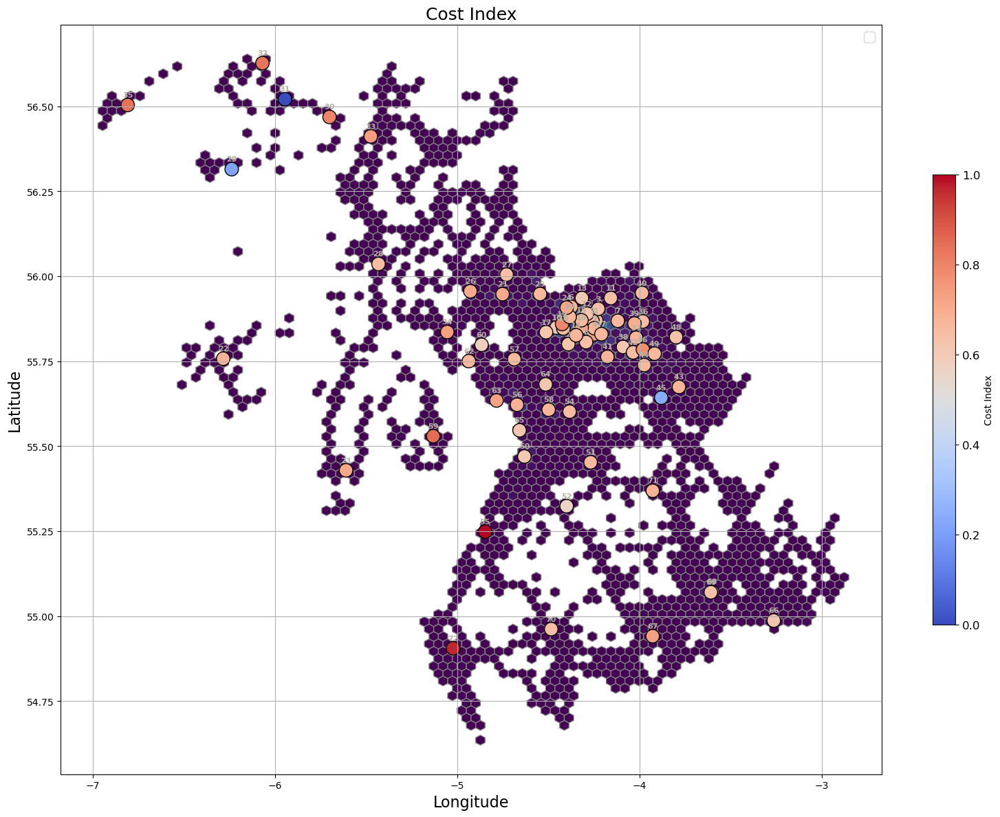

In [89]:
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)

# Scatter plot for SFI values
scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], c=res_index_df_norm['cost_index'], cmap='coolwarm', s=200, edgecolors='k')

# Add colorbar with reduced size
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='Cost Index')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
for i, txt in enumerate(res_index_df_norm['station_number']):
    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="#B6B2A5")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Cost Index', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

#plt.savefig("outcomes/location_index_map.png")
# Show plot
plt.show()


In [90]:
res_index_df_norm.iloc[69]

name                            Stranraer
latitude                        54.905228
longitude                       -5.022334
n_officers                           36.0
simulation_name                station_72
immediate_count                  0.155844
prompt_count                     0.229839
other_count                      0.135135
station_number                         72
immediate_within_time_count      0.916667
prompt_within_time_count              1.0
other_within_time_count               1.0
min_SFI                          0.000481
Location Category                   Urban
imm_res_per_officer              0.095238
pro_res_per_officer              0.121795
other_res_per_officer            0.042735
neg_min_SFI                      0.734975
service_provision_index           0.62646
cost_index                       0.965454
Name: 69, dtype: object

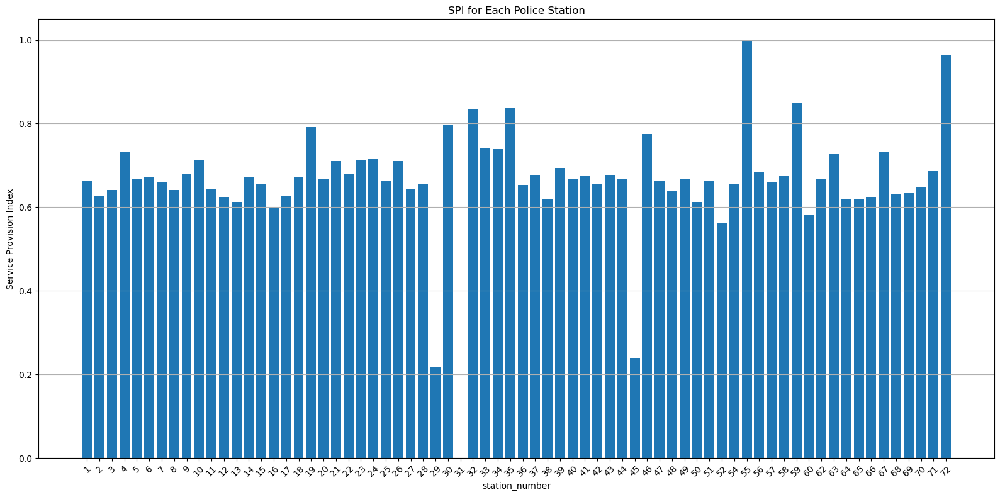

In [91]:
# Plotting SFI values
plt.figure(figsize=(16, 8))
plt.bar(res_index_df_norm['station_number'], res_index_df_norm["cost_index"])
plt.xlabel('station_number')
plt.ylabel('Service Provision Index')
plt.title('SPI for Each Police Station')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
#plt.savefig("outcomes/police_station_min_SFI.png")
plt.show()

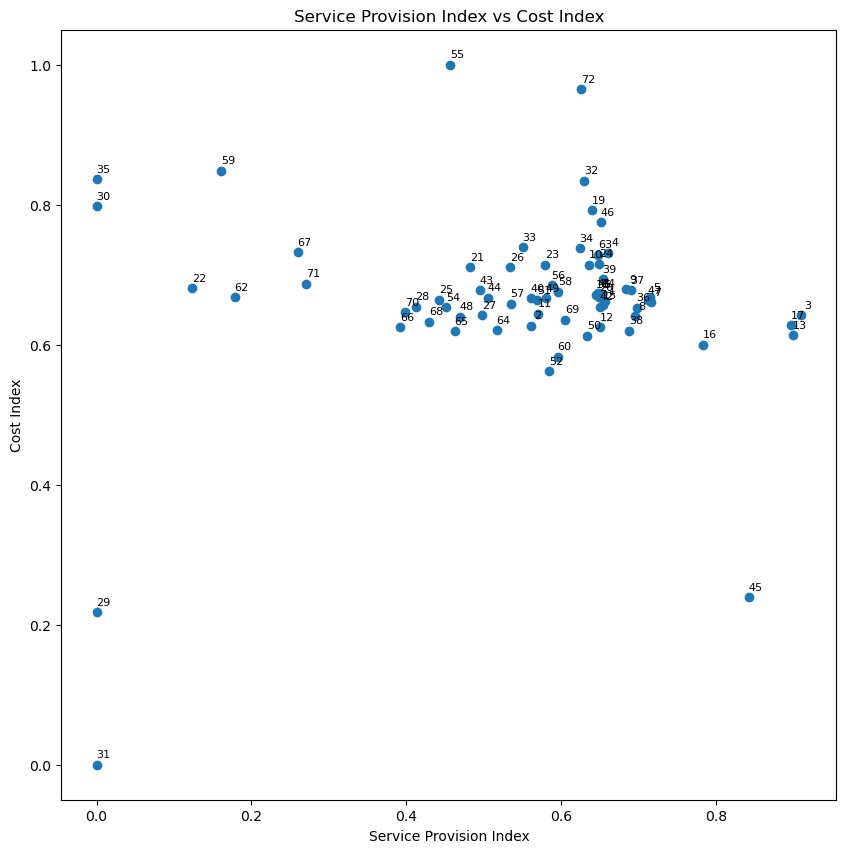

In [92]:
# Plotting the scatter plot
plt.figure(figsize=(10, 10))
plt.scatter(res_index_df_norm['service_provision_index'], res_index_df_norm['cost_index'])

# Annotating the scatter points
for i, row in res_index_df_norm.iterrows():
    plt.annotate(row['station_number'], 
                 (row['service_provision_index'], row['cost_index']),
                 textcoords="offset points", 
                 xytext=(5,5), 
                 ha='center', 
                fontsize=8)

# Adding titles and labels
plt.title('Service Provision Index vs Cost Index')
plt.xlabel('Service Provision Index')
plt.ylabel('Cost Index')

plt.show()

In [93]:
res_index_df_norm.head()

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,prompt_within_time_count,other_within_time_count,min_SFI,Location Category,imm_res_per_officer,pro_res_per_officer,other_res_per_officer,neg_min_SFI,service_provision_index,cost_index
0,"Baird Street, Glasgow",55.869542,-4.236984,153.0,station_1,0.545455,0.556452,0.864865,1,1.000000,1.0,1.0,0.001374,Urban,0.078431,0.069382,0.064354,0.242646,0.656980,0.662867
1,Barrhead,55.799930,-4.390426,37.0,station_2,0.168831,0.274194,0.270270,2,0.769231,1.0,1.0,0.001211,Urban,0.100386,0.141372,0.083160,0.332441,0.561486,0.627110
2,Bishopbriggs,55.903822,-4.226463,4.0,station_3,0.142857,0.129032,0.351351,3,1.000000,1.0,1.0,0.001403,Urban,0.785714,0.615385,1.000000,0.226827,0.910381,0.641822
3,"Cathcart, Glasgow",55.829003,-4.248148,117.0,station_4,0.480519,0.419355,0.783784,4,1.000000,1.0,1.0,0.001343,Urban,0.090354,0.068376,0.076266,0.259679,0.660291,0.731466
4,Cowcaddens,55.868494,-4.257927,89.0,station_5,1.000000,1.000000,1.000000,5,1.000000,1.0,1.0,0.001357,Urban,0.247191,0.214347,0.127917,0.252326,0.715146,0.667907


## Infrastructure Index

In [94]:
# These are the property columns
property_columns = [
    'Total Headcount', 
    "Property Size GIA sq.m",
    'Custody Yes/No',
    'Ownership',
    'Co-Located', 'Co-Location Partner(s)', 'Co-Location Category',
    "Condition Grade",
    'Forensic Labs (Yes / No)',
       'Firearms range (Yes / No)', 'Ammunitions store (Yes / No)',
       'Mountain Rescue (Yes / No)', 'Dogs  / Horses (Yes / No)',
       'Fleet workshop (Yes / No)', 'Mortuary (Yes / No)', 'Stores (Yes / No)',
       'Critical IT infrastructure (Yes / No)', 'Accommodation (Yes / No)',
       'Intelligence Support (Yes / No)', 'Number of Parking Spaces',
       'EV Infrastructure', "Co-Located"
]



In [95]:
# Import the CSV
estates_imputed_df = pd.read_csv("data/Estate_Informationv3_imputed.csv")
estates_imputed_df["Co-Located"] = estates_imputed_df["Co-Located"].astype(str)

In [96]:
# Columns
# Officer Count
# Property Square
# Co located
# Condition grade
infrastructure_columns = [
    "DPU_ResponseOfficers_Count",
    "Property Size GIA sq.m",
    "Co-Located",
    "Condition Grade"
]
estates_imputed_df[infrastructure_columns]

,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade
0,153.0,3502.0,No,B
1,37.0,562.0,No,C
2,4.0,450.0,No,B
3,117.0,2361.0,No,B
4,89.0,3882.0,No,B
...,...,...,...,...
67,21.0,4029.0,No,B
68,89.0,3182.0,No,C
69,18.0,392.0,No,B
70,15.0,242.0,No,B


In [97]:
estates_imputed_df["Co-Located"].unique()

array(['No', 'Yes', 'yes'], dtype=object)

In [98]:
from sklearn.preprocessing import MinMaxScaler


# Convert "Condition Grade" to numerical values
condition_mapping = {
    "A":3, 
    "B":2,
    "C":1
}
df = estates_imputed_df.copy()
df["Condition Grade"] = df["Condition Grade"].map(condition_mapping)

# Normalize "Co-Located" column values
df["Co-Located"] = df["Co-Located"].str.lower().map({'yes': 1, 'no': 0})

# Min-Max Scaling
scaler = MinMaxScaler()
scaled_values = scaler.fit_transform(df[["DPU_ResponseOfficers_Count", "Property Size GIA sq.m", "Co-Located", "Condition Grade"]])

# Create new DataFrame with normalized values
normalized_df = pd.DataFrame(scaled_values, columns=["DPU_ResponseOfficers_Count", "Property Size GIA sq.m", "Co-Located", "Condition Grade"])

# Include the "Activity code" column
normalized_df["Activity code"] = df["Activity code"]
normalized_df["name"] = df["Site Name"]


# Reorder columns to place "Activity code" first
normalized_df = normalized_df[["name","Activity code", "DPU_ResponseOfficers_Count", "Property Size GIA sq.m", "Co-Located", "Condition Grade"]]

In [99]:
normalized_df["infrastructure metric"] = 0.25 * (normalized_df["DPU_ResponseOfficers_Count"] + normalized_df["Property Size GIA sq.m"] + normalized_df["Co-Located"] + normalized_df["Condition Grade"])


In [100]:
res_index_df.merge(
    normalized_df[['name', 'DPU_ResponseOfficers_Count', 'Property Size GIA sq.m', 
                   'Co-Located', 'Condition Grade', 'infrastructure metric']],
    on='name',
    how='left'  # 'left' ensures all rows from res_index_df are kept
)

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,...,min_SFI,Location Category,imm_res_per_officer,pro_res_per_officer,other_res_per_officer,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade,infrastructure metric
0,"Baird Street, Glasgow",55.869542,-4.236984,153.0,station_1,42.0,138.0,32.0,1,1.000000,...,0.001374,Urban,0.274510,0.901961,0.209150,0.421488,0.668775,0.0,0.5,0.397566
1,Barrhead,55.799930,-4.390426,37.0,station_2,13.0,68.0,10.0,2,0.769231,...,0.001211,Urban,0.351351,1.837838,0.270270,0.101928,0.105233,0.0,0.0,0.051790
2,Bishopbriggs,55.903822,-4.226463,4.0,station_3,11.0,32.0,13.0,3,1.000000,...,0.001403,Urban,2.750000,8.000000,3.250000,0.011019,0.083765,0.0,0.5,0.148696
3,"Cathcart, Glasgow",55.829003,-4.248148,117.0,station_4,37.0,104.0,29.0,4,1.000000,...,0.001343,Urban,0.316239,0.888889,0.247863,0.322314,0.450067,0.0,0.5,0.318095
4,Cowcaddens,55.868494,-4.257927,89.0,station_5,77.0,248.0,37.0,5,1.000000,...,0.001357,Urban,0.865169,2.786517,0.415730,0.245179,0.741614,0.0,0.5,0.371698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,Dumfries,55.071247,-3.601948,21.0,station_68,22.0,48.0,14.0,68,0.363636,...,0.000623,Urban,1.047619,2.285714,0.666667,0.057851,0.769791,0.0,0.5,0.331911
68,Dumfries (Loreburn St),55.069975,-3.609086,89.0,station_69,32.0,96.0,14.0,69,0.875000,...,0.000571,Urban,0.359551,1.078652,0.157303,0.245179,0.607437,0.0,0.0,0.213154
69,Newton Stewart,54.961680,-4.484344,18.0,station_70,7.0,14.0,5.0,70,0.428571,...,0.001048,Urban,0.388889,0.777778,0.277778,0.049587,0.072647,0.0,0.5,0.155558
70,Sanquhar,55.368586,-3.927867,15.0,station_71,14.0,21.0,4.0,71,0.071429,...,0.001576,Urban,0.933333,1.400000,0.266667,0.041322,0.043895,0.0,0.5,0.146304


In [101]:
res_index_df_norm = res_index_df_norm.merge(
    normalized_df[['name', 'DPU_ResponseOfficers_Count', 'Property Size GIA sq.m', 
                   'Co-Located', 'Condition Grade', 'infrastructure metric']],
    on='name',
    how='left'  # 'left' ensures all rows from res_index_df are kept
)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


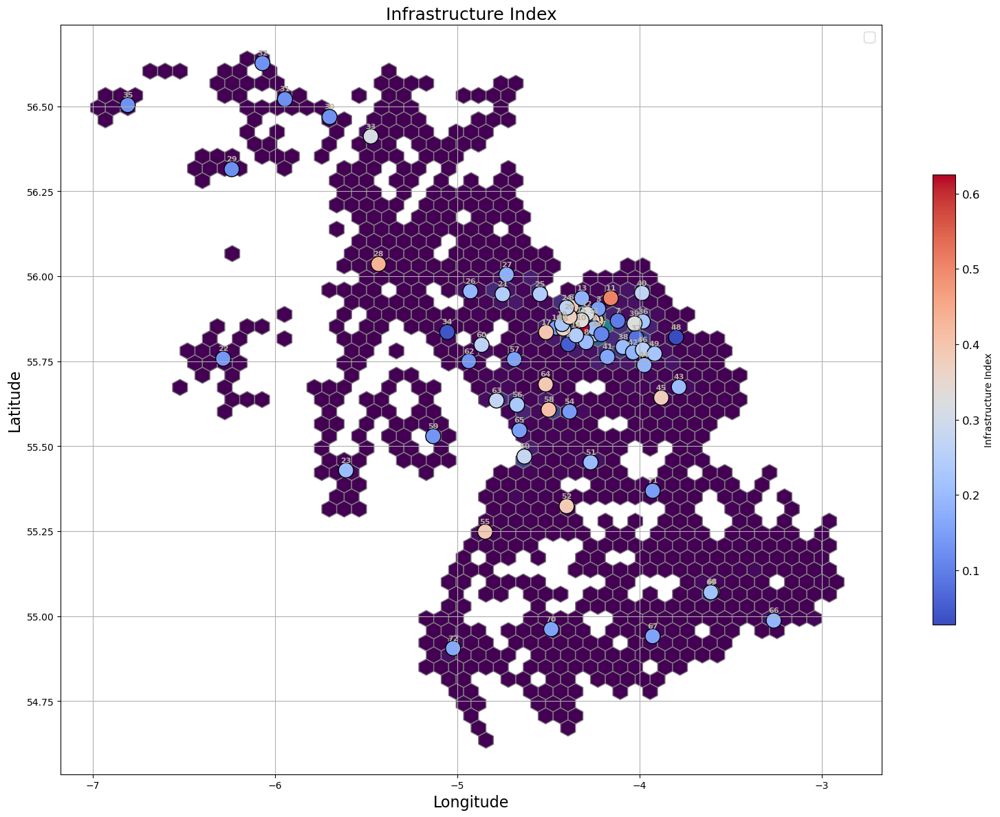

In [102]:
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=50, color="grey", mincnt=1, edgecolors='none')

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)

# Scatter plot for SFI values
scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], c=res_index_df_norm['infrastructure metric'], cmap='coolwarm', 
                     s=250, edgecolors='k')

# Add colorbar with reduced size
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='Infrastructure Index')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
for i, txt in enumerate(res_index_df_norm['station_number']):
    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="#B6B2A5")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Infrastructure Index', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/infrastructure_index_map.png")
# Show plot
plt.show()


In [103]:
# Calculating Service Provision Index

def calculate_estate_index(df):
    
    # Priority Weightings
    weights = {
        "location":0.233,
        "resolution":0.257,
        "resolution_within_time":0.418,
        "infrastructure":0.092
    }
    
    # So that they add up to one (1)
    # Calculate the sum of the weights
    total_weight = sum(weights.values())

    # Scale each weight proportionally
    weights = {key: value / total_weight for key, value in weights.items()}

    
    # Location Score
    loc_score = df["neg_min_SFI"] * weights["location"]
    
    # Resolution of Incidents score
    res_imm_score= df["imm_res_per_officer"]*0.72
    res_pro_score= df["pro_res_per_officer"]*0.21
    res_other_score= df["other_res_per_officer"]*0.07
    res_score = (res_imm_score + res_pro_score + res_other_score) * weights["resolution"]
    
    # Resolution of Incidents on Time score
    res_imm_time_score= df["immediate_within_time_count"]*0.72
    res_pro_time_score= df["prompt_within_time_count"]*0.21
    res_other_time_score= df["other_within_time_count"]*0.07
    res_time_score = (res_imm_time_score + res_pro_time_score + res_other_time_score) * weights["resolution_within_time"]
    
    # Infrastructure
    n_officers_score = df["DPU_ResponseOfficers_Count"] * 0.57
    size_score = df["Property Size GIA sq.m"] * 0.09
    co_location_score = df["Co-Located"] * 0.12
    condition_grade_score = df["Condition Grade"] * 0.22
    infrastructure_score = (n_officers_score + size_score + co_location_score + condition_grade_score) * weights["infrastructure"]

    return loc_score + res_score + res_time_score + infrastructure_score

res_index_df_norm["estate_index"] = calculate_estate_index(res_index_df_norm)

In [104]:
res_index_df_norm

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,...,other_res_per_officer,neg_min_SFI,service_provision_index,cost_index,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade,infrastructure metric,estate_index
0,"Baird Street, Glasgow",55.869542,-4.236984,153.0,station_1,0.545455,0.556452,0.864865,1,1.000000,...,0.064354,0.242646,0.656980,0.662867,0.421488,0.668775,0.0,0.5,0.397566,0.531712
1,Barrhead,55.799930,-4.390426,37.0,station_2,0.168831,0.274194,0.270270,2,0.769231,...,0.083160,0.332441,0.561486,0.627110,0.101928,0.105233,0.0,0.0,0.051790,0.459924
2,Bishopbriggs,55.903822,-4.226463,4.0,station_3,0.142857,0.129032,0.351351,3,1.000000,...,1.000000,0.226827,0.910381,0.641822,0.011019,0.083765,0.0,0.5,0.148696,0.678833
3,"Cathcart, Glasgow",55.829003,-4.248148,117.0,station_4,0.480519,0.419355,0.783784,4,1.000000,...,0.076266,0.259679,0.660291,0.731466,0.322314,0.450067,0.0,0.5,0.318095,0.531035
4,Cowcaddens,55.868494,-4.257927,89.0,station_5,1.000000,1.000000,1.000000,5,1.000000,...,0.127917,0.252326,0.715146,0.667907,0.245179,0.741614,0.0,0.5,0.371698,0.565519
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,Dumfries,55.071247,-3.601948,21.0,station_68,0.285714,0.193548,0.378378,68,0.363636,...,0.205128,0.656466,0.429854,0.632911,0.057851,0.769791,0.0,0.5,0.331911,0.467530
66,Dumfries (Loreburn St),55.069975,-3.609086,89.0,station_69,0.415584,0.387097,0.378378,69,0.875000,...,0.048401,0.685336,0.605753,0.635556,0.245179,0.607437,0.0,0.0,0.213154,0.582308
67,Newton Stewart,54.961680,-4.484344,18.0,station_70,0.090909,0.056452,0.135135,70,0.428571,...,0.085470,0.422222,0.398160,0.646700,0.049587,0.072647,0.0,0.5,0.155558,0.383049
68,Sanquhar,55.368586,-3.927867,15.0,station_71,0.181818,0.084677,0.108108,71,0.071429,...,0.082051,0.131697,0.270325,0.687090,0.041322,0.043895,0.0,0.5,0.146304,0.234325


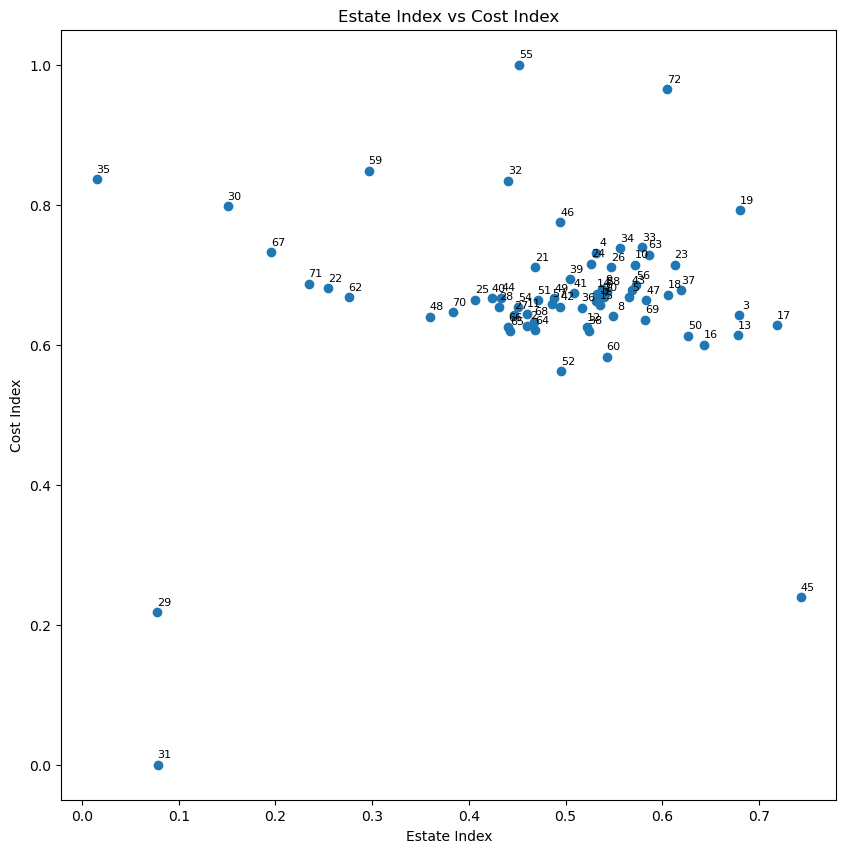

In [105]:
# Plotting the scatter plot
plt.figure(figsize=(10, 10))
plt.scatter(res_index_df_norm['estate_index'], res_index_df_norm['cost_index'])

# Annotating the scatter points
for i, row in res_index_df_norm.iterrows():
    plt.annotate(row['station_number'], 
                 (row['estate_index'], row['cost_index']),
                 textcoords="offset points", 
                 xytext=(5,5), 
                 ha='center', 
                fontsize=8)

# Adding titles and labels
plt.title('Estate Index vs Cost Index')
plt.xlabel('Estate Index')
plt.ylabel('Cost Index')

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


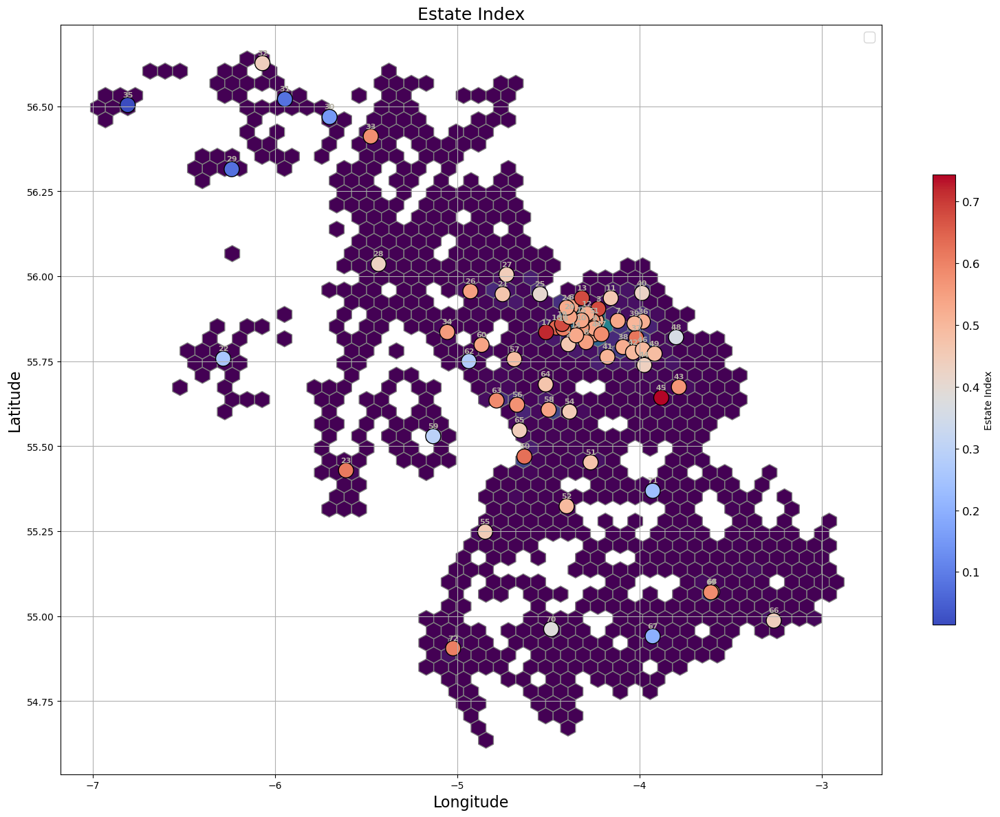

In [106]:
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], 
                gridsize=50, color="grey", mincnt=1, edgecolors='none')

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)

# Scatter plot for SFI values
scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], c=res_index_df_norm['estate_index'], 
                     cmap='coolwarm', s=250, edgecolors='k')

# Add colorbar with reduced size
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='Estate Index')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
for i, txt in enumerate(res_index_df_norm['station_number']):
    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="#B6B2A5")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Estate Index', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/estate_index_map.png")
# Show plot
plt.show()


### Cost Metric

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


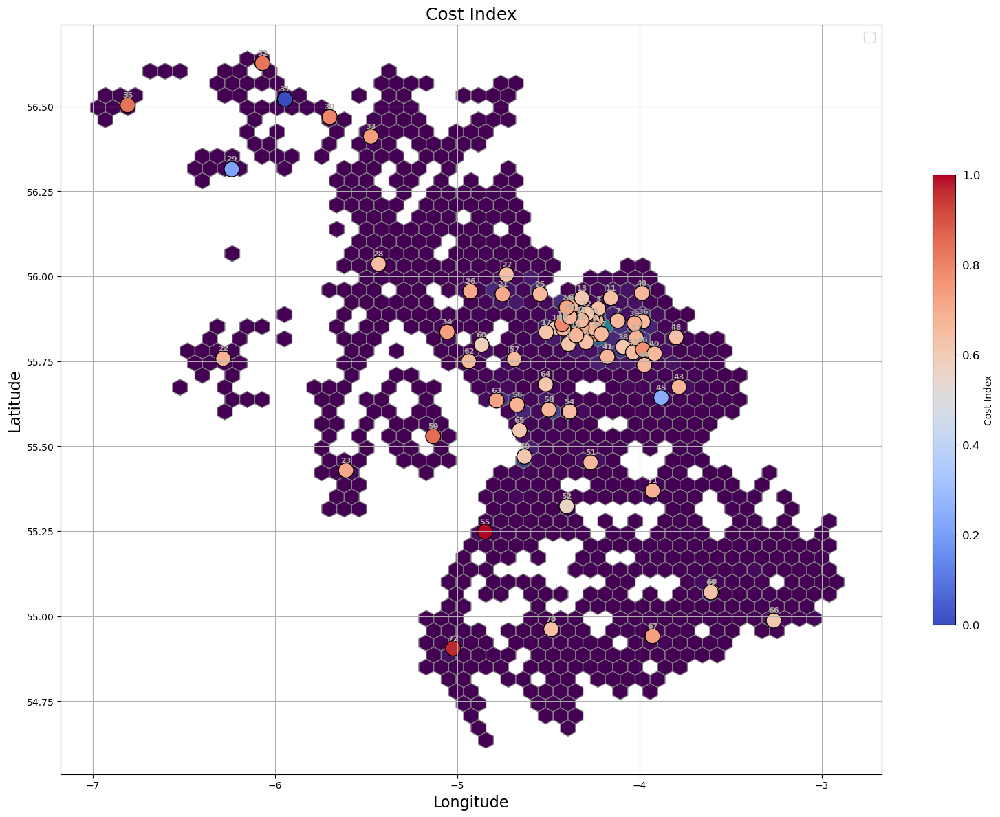

In [107]:
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=50, color="grey", mincnt=1, edgecolors='none')

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)

# Scatter plot for SFI values
scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'],
                     c=res_index_df_norm['cost_index'], cmap='coolwarm', 
                     s=250, edgecolors='k')

# Add colorbar with reduced size
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='Cost Index')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
for i, txt in enumerate(res_index_df_norm['station_number']):
    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), fontsize=8, fontweight=800, ha='center', va='bottom', color="#B6B2A5")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Cost Index', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/cost_index_map.png")
# Show plot
plt.show()


In [108]:
estates_imputed_df[infrastructure_columns]

,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade
0,153.0,3502.0,No,B
1,37.0,562.0,No,C
2,4.0,450.0,No,B
3,117.0,2361.0,No,B
4,89.0,3882.0,No,B
...,...,...,...,...
67,21.0,4029.0,No,B
68,89.0,3182.0,No,C
69,18.0,392.0,No,B
70,15.0,242.0,No,B


In [109]:
estates_imputed_df.columns

Index(['Unnamed: 0', 'Activity code', 'Property Classification',
       'Record Level', 'Division Name', 'Division', 'Unitary Authority',
       'Site Name', 'Property Name', 'X (Easting)', 'Y (Northing)',
       'Location Category (A=Urban, B=Rural, C=Remote, D=Islands)',
       'Property Size GIA sq.m', 'Primary Classification (Use)', 'Ownership',
       'Co-Located', 'Co-Location Partner(s)', 'Co-Location Category',
       'Listing', 'Year of Construction', 'Condition Grade',
       'Prescribed station? Y/N', 'Deployment station? Y/N',
       'House attached to station?', 'Rent', 'Property Service Charge',
       'Non Domestic Rates', 'Gas (£)', 'Electricity',
       'Heating Fuel Oil & Solid Fuel', 'Water Rates & Sewarage',
       'Fixtures & Fittings', 'Repairs & Maintenance', 'Cleaning',
       'Manned Guard/Security', 'Soft Fm Contract Mgt fee',
       'Other property costs', 'Miscellaneous Costs',
       'Total 22-23 Running Costs', 'DPU_ResponseOfficers_Count',
       'Total H

In [110]:
res_index_df_norm.to_csv("outcomes/res_index_norm_df.csv")

### In a Grid, search for locations that have the maximise the Location index

In [111]:
cluster_centers

,latitude,longitude,cluster,geometry,index,probability,n_ps
0,55.050222,-3.689042,0,POINT (-3.68904 55.05022),0,0.029983,3
1,55.856085,-4.291574,1,POINT (-4.29157 55.85608),1,0.233710,11
2,55.643743,-4.704663,2,POINT (-4.70466 55.64374),2,0.057663,6
3,55.827197,-4.001112,3,POINT (-4.00111 55.82720),3,0.167860,10
4,55.964902,-4.666253,4,POINT (-4.66625 55.96490),4,0.052847,3
5,55.893675,-4.924149,5,POINT (-4.92415 55.89367),5,0.019841,4
6,54.907192,-4.847200,6,POINT (-4.84720 54.90719),6,0.012052,2
7,56.334357,-5.492080,7,POINT (-5.49208 56.33436),7,0.010165,7
8,55.862671,-4.423873,8,POINT (-4.42387 55.86267),8,0.127409,8
9,55.567098,-4.430699,9,POINT (-4.43070 55.56710),9,0.047627,3


In [112]:
cluster_centers.columns

Index(['latitude', 'longitude', 'cluster', 'geometry', 'index', 'probability',
       'n_ps'],
      dtype='object')

In [113]:
cluster_centers

,latitude,longitude,cluster,geometry,index,probability,n_ps
0,55.050222,-3.689042,0,POINT (-3.68904 55.05022),0,0.029983,3
1,55.856085,-4.291574,1,POINT (-4.29157 55.85608),1,0.233710,11
2,55.643743,-4.704663,2,POINT (-4.70466 55.64374),2,0.057663,6
3,55.827197,-4.001112,3,POINT (-4.00111 55.82720),3,0.167860,10
4,55.964902,-4.666253,4,POINT (-4.66625 55.96490),4,0.052847,3
5,55.893675,-4.924149,5,POINT (-4.92415 55.89367),5,0.019841,4
6,54.907192,-4.847200,6,POINT (-4.84720 54.90719),6,0.012052,2
7,56.334357,-5.492080,7,POINT (-5.49208 56.33436),7,0.010165,7
8,55.862671,-4.423873,8,POINT (-4.42387 55.86267),8,0.127409,8
9,55.567098,-4.430699,9,POINT (-4.43070 55.56710),9,0.047627,3


In [114]:
cluster_centers.sort_values("probability")

,latitude,longitude,cluster,geometry,index,probability,n_ps
10,55.536413,-5.699298,10,POINT (-5.69930 55.53641),10,0.003783,2
7,56.334357,-5.492080,7,POINT (-5.49208 56.33436),7,0.010165,7
6,54.907192,-4.847200,6,POINT (-4.84720 54.90719),6,0.012052,2
12,55.081972,-3.277005,12,POINT (-3.27700 55.08197),12,0.015878,1
5,55.893675,-4.924149,5,POINT (-4.92415 55.89367),5,0.019841,4
14,55.683756,-3.801481,14,POINT (-3.80148 55.68376),14,0.027731,3
0,55.050222,-3.689042,0,POINT (-3.68904 55.05022),0,0.029983,3
13,55.440285,-4.636290,13,POINT (-4.63629 55.44028),13,0.042637,5
9,55.567098,-4.430699,9,POINT (-4.43070 55.56710),9,0.047627,3
4,55.964902,-4.666253,4,POINT (-4.66625 55.96490),4,0.052847,3


### Generating location around cluster centers

In [115]:
# Function to convert km to degrees latitude and longitude
def km_to_lat_lon(lat, km_distance):
    # Latitude change (1 degree = 111 km)
    delta_lat = km_distance / 111.0
    
    # Longitude change (1 degree = 111 km * cos(latitude))
    delta_lon = km_distance / (111.0 * np.cos(np.radians(lat)))
    
    return delta_lat, delta_lon

# Function to generate locations around cluster centers
def generate_locations(cluster_centers, mean_distance_km=15, std_dev_km=2.5):
    locations = []
    
    # Directions in degrees and their corresponding vector components
    directions = {
        'N': (1, 0), 'S': (-1, 0), 'E': (0, 1), 'W': (0, -1),
        'NE': (1, 1), 'NW': (1, -1), 'SE': (-1, 1), 'SW': (-1, -1)
    }
    
    for _, row in cluster_centers.iterrows():
        lat = row['latitude']
        lon = row['longitude']
        
        for direction, (lat_sign, lon_sign) in directions.items():
            # Sample a distance from the normal distribution
            distance_km = np.random.normal(mean_distance_km, std_dev_km)
            
            # Convert km to lat and lon changes
            delta_lat, delta_lon = km_to_lat_lon(lat, distance_km)
            
            # Calculate new latitude and longitude
            new_lat = lat + lat_sign * delta_lat
            new_lon = lon + lon_sign * delta_lon
            
            locations.append({
                'center_lat': lat, 'center_lon': lon, 
                'new_lat': new_lat, 'new_lon': new_lon,
                'direction': direction
            })
    
    return pd.DataFrame(locations)


In [116]:
# Take cluster centers
from sklearn.metrics.pairwise import haversine_distances
n_places = 100

locations_df = generate_locations(cluster_centers)

grid_points = np.c_[locations_df["new_lat"].ravel(), locations_df["new_lon"].ravel()]

# Convert coordinates to radians for Haversine distance calculation
cluster_coords = np.radians(cluster_centers[['latitude', 'longitude']])
grid_coords = np.radians(grid_points)

# Calculate Haversine distances between each grid point and each cluster center
distance_matrix = haversine_distances(grid_coords, cluster_coords) * 6371  # Convert to kilometers

# Normalize the distances (to bring them between 0 and 1)
normalized_distances_matrix = (distance_matrix - np.min(distance_matrix)) / (np.max(distance_matrix) - np.min(distance_matrix))

# Vectorized calculation of the SFI matrix
SFI_matrix = normalized_distances_matrix * cluster_centers['probability'].values

# Sum the SFI values for each grid point across all cluster centers
summed_SFI_values = np.min(SFI_matrix, axis=1)

# Get the indices of the 50 lowest summed SFI values
lowest_indices = np.argsort(summed_SFI_values)[:50]

# Extract the coordinates and summed SFI values of these points
lowest_SFI_values = summed_SFI_values[lowest_indices]
lowest_SFI_coords = grid_points[lowest_indices]

# Create a DataFrame for easy viewing
lowest_SFI_df = pd.DataFrame({
    'Latitude': lowest_SFI_coords[:, 0],
    'Longitude': lowest_SFI_coords[:, 1],
    'Summed SFI Value': lowest_SFI_values
})

# Show the DataFrame with 50 lowest summed SFI values and their coordinates
lowest_SFI_df.head()

,Latitude,Longitude,Summed SFI Value
0,55.438189,-4.658678,0.000000
1,55.693527,-3.763133,0.000155
2,55.536413,-5.521397,0.000171
3,55.536413,-5.922280,0.000220
4,55.545868,-4.450163,0.000270


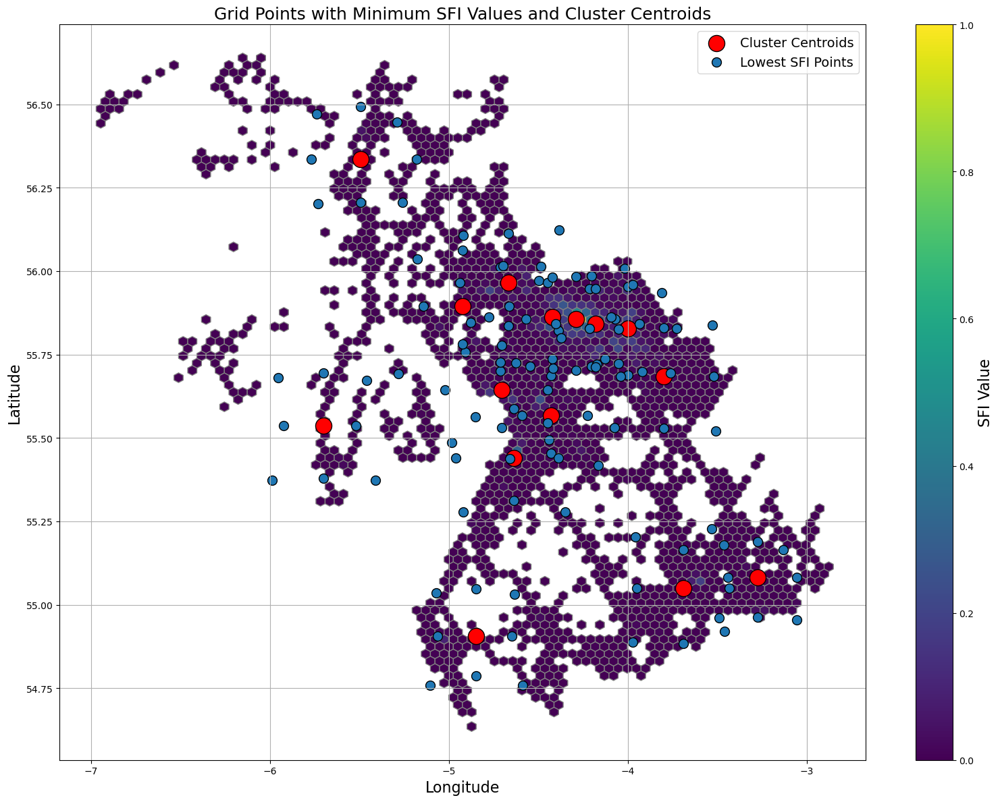

In [117]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')


# Scatter plot for the cluster centroids
centroid_scatter = ax.scatter(cluster_centers['longitude'], cluster_centers['latitude'], 
                              c='red', edgecolor='black', s=300, marker='o', label='Cluster Centroids')

# Scatter plot of the lowest SFI points, colored by the SFI values
scatter = ax.scatter(locations_df["new_lon"].ravel(), locations_df["new_lat"].ravel(), s=100, 
                     edgecolor='black', marker='o', label='Lowest SFI Points')


#scatter = ax.scatter(locations_df['center_lon'], locations_df['center_lat'], 
#                     s=100, 
#                     edgecolor='black', marker='o', label='Lowest SFI Points')


#ax.scatter(grid_points[:, 1], grid_points[:, 0], 
#                              c='blue', edgecolor='black', s=30, marker='o', label='grid points')


# Add colorbar for SFI values
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('SFI Value', fontsize=16)

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Grid Points with Minimum SFI Values and Cluster Centroids', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()


In [118]:
locations_df.head()

,center_lat,center_lon,new_lat,new_lon,direction
0,55.050222,-3.689042,55.165877,-3.689042,N
1,55.050222,-3.689042,54.883910,-3.689042,S
2,55.050222,-3.689042,55.050222,-3.432638,E
3,55.050222,-3.689042,55.050222,-3.949561,W
4,55.050222,-3.689042,55.178263,-3.465529,NE


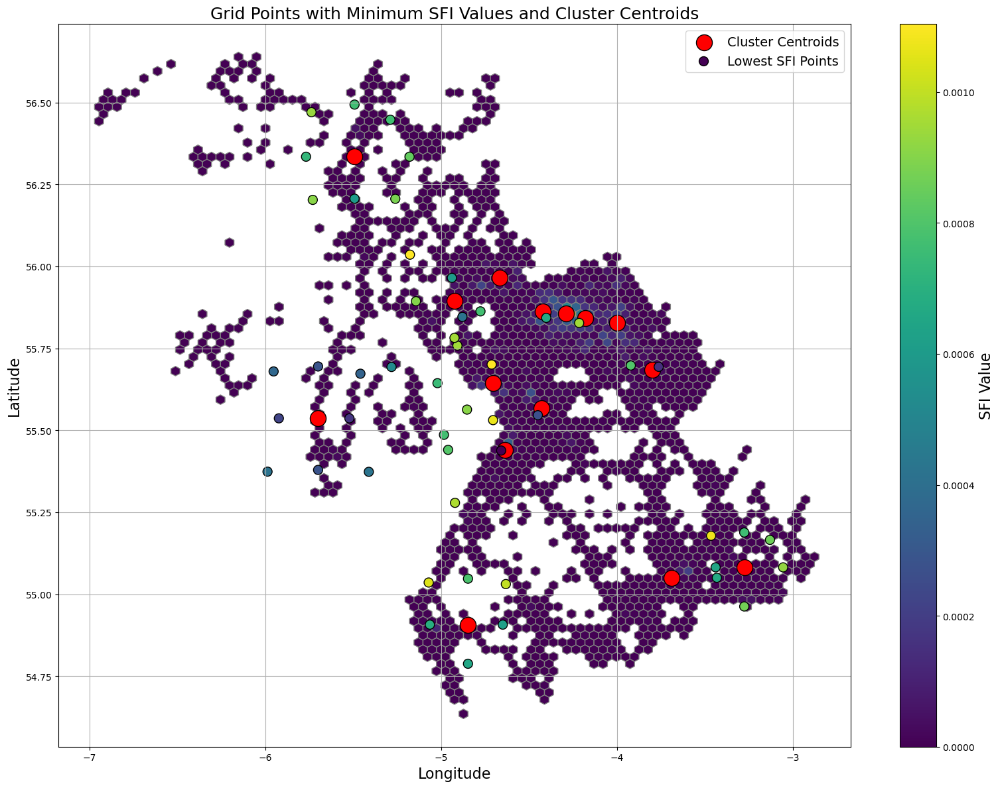

In [119]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')


# Scatter plot for the cluster centroids
centroid_scatter = ax.scatter(cluster_centers['longitude'], cluster_centers['latitude'], 
                              c='red', edgecolor='black', s=300, marker='o', label='Cluster Centroids')

# Scatter plot of the lowest SFI points, colored by the SFI values
scatter = ax.scatter(lowest_SFI_df['Longitude'], lowest_SFI_df['Latitude'], 
                     c=lowest_SFI_df['Summed SFI Value'], cmap='viridis', s=100, 
                     edgecolor='black', marker='o', label='Lowest SFI Points')


#ax.scatter(grid_points[:, 1], grid_points[:, 0], 
#                              c='blue', edgecolor='black', s=30, marker='o', label='grid points')


# Add colorbar for SFI values
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('SFI Value', fontsize=16)

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Grid Points with Minimum SFI Values and Cluster Centroids', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()


### Make the cuts

In [120]:
res_index_df_norm["estate_per_cost"] = res_index_df_norm["estate_index"]/res_index_df_norm["cost_index"]

In [121]:
res_index_df_norm.sort_values("estate_per_cost")

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,...,neg_min_SFI,service_provision_index,cost_index,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade,infrastructure metric,estate_index,estate_per_cost
34,Tiree (Scarinish),56.503462,-6.807142,1.0,station_35,0.000000,0.000000,0.000000,35,0.000000,...,0.020654,0.000000,0.836806,0.002755,0.009105,0.0,0.5,0.127965,0.015152,0.018107
29,Mull (Craignure),56.468142,-5.699983,1.0,station_30,0.000000,0.000000,0.000000,30,0.000000,...,0.602369,0.000000,0.797820,0.002755,0.009201,0.0,0.5,0.127989,0.150693,0.188880
64,Castle Douglas,54.940814,-3.928039,25.0,station_67,0.090909,0.137097,0.135135,67,0.142857,...,0.000000,0.259766,0.732232,0.068871,0.051179,0.0,0.5,0.155012,0.195746,0.267328
68,Sanquhar,55.368586,-3.927867,15.0,station_71,0.181818,0.084677,0.108108,71,0.071429,...,0.131697,0.270325,0.687090,0.041322,0.043895,0.0,0.5,0.146304,0.234325,0.341040
57,Lamlash,55.529172,-5.131520,8.0,station_59,0.012987,0.048387,0.000000,59,0.000000,...,0.728004,0.161109,0.848859,0.022039,0.015526,0.0,0.5,0.134391,0.296275,0.349027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,"Ferguslie Park, Paisley",55.848759,-4.455780,10.0,station_16,0.233766,0.229839,0.324324,16,0.944444,...,0.446315,0.783918,0.599962,0.027548,0.071305,0.0,0.5,0.149713,0.642896,1.071561
12,Milngavie,55.935420,-4.316179,3.0,station_13,0.103896,0.100806,0.189189,13,1.000000,...,0.254452,0.900046,0.613218,0.008264,0.228867,0.0,0.5,0.184283,0.678231,1.106020
16,Johnstone,55.835116,-4.512687,8.0,station_17,0.363636,0.310484,0.297297,17,0.857143,...,0.376255,0.897774,0.627571,0.022039,0.068430,1.0,0.5,0.397617,0.718165,1.144357
44,Lesmahagow,55.642510,-3.880826,3.0,station_45,0.129870,0.157258,0.216216,45,0.700000,...,0.640047,0.842922,0.239505,0.008264,0.003259,1.0,0.5,0.377881,0.743423,3.103998


In [122]:
res_index_df_norm.sort_values("estate_per_cost")

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,...,neg_min_SFI,service_provision_index,cost_index,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade,infrastructure metric,estate_index,estate_per_cost
34,Tiree (Scarinish),56.503462,-6.807142,1.0,station_35,0.000000,0.000000,0.000000,35,0.000000,...,0.020654,0.000000,0.836806,0.002755,0.009105,0.0,0.5,0.127965,0.015152,0.018107
29,Mull (Craignure),56.468142,-5.699983,1.0,station_30,0.000000,0.000000,0.000000,30,0.000000,...,0.602369,0.000000,0.797820,0.002755,0.009201,0.0,0.5,0.127989,0.150693,0.188880
64,Castle Douglas,54.940814,-3.928039,25.0,station_67,0.090909,0.137097,0.135135,67,0.142857,...,0.000000,0.259766,0.732232,0.068871,0.051179,0.0,0.5,0.155012,0.195746,0.267328
68,Sanquhar,55.368586,-3.927867,15.0,station_71,0.181818,0.084677,0.108108,71,0.071429,...,0.131697,0.270325,0.687090,0.041322,0.043895,0.0,0.5,0.146304,0.234325,0.341040
57,Lamlash,55.529172,-5.131520,8.0,station_59,0.012987,0.048387,0.000000,59,0.000000,...,0.728004,0.161109,0.848859,0.022039,0.015526,0.0,0.5,0.134391,0.296275,0.349027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,"Ferguslie Park, Paisley",55.848759,-4.455780,10.0,station_16,0.233766,0.229839,0.324324,16,0.944444,...,0.446315,0.783918,0.599962,0.027548,0.071305,0.0,0.5,0.149713,0.642896,1.071561
12,Milngavie,55.935420,-4.316179,3.0,station_13,0.103896,0.100806,0.189189,13,1.000000,...,0.254452,0.900046,0.613218,0.008264,0.228867,0.0,0.5,0.184283,0.678231,1.106020
16,Johnstone,55.835116,-4.512687,8.0,station_17,0.363636,0.310484,0.297297,17,0.857143,...,0.376255,0.897774,0.627571,0.022039,0.068430,1.0,0.5,0.397617,0.718165,1.144357
44,Lesmahagow,55.642510,-3.880826,3.0,station_45,0.129870,0.157258,0.216216,45,0.700000,...,0.640047,0.842922,0.239505,0.008264,0.003259,1.0,0.5,0.377881,0.743423,3.103998


In [123]:
res_index_df_norm.shape[0]

70

In [124]:
# Cut-off values
cut_off_percentile = 25

#res_index_df_norm["estate_per_cost"] = res_index_df_norm["estate_per_cost"].fillna(0)

# Calculate the 25th percentile cutoff value for 'estate_per_cost'
cutoff_value = np.percentile(res_index_df_norm['estate_per_cost'], cut_off_percentile)

# Split the DataFrame into remaining and cut off based on the cutoff value
remaining_df = res_index_df_norm[res_index_df_norm['estate_per_cost'] > cutoff_value]
cutoff_df = res_index_df_norm[res_index_df_norm['estate_per_cost'] <= cutoff_value]

In [125]:
#  
n_police_stations_cutoff = (res_index_df_norm.shape[0] - remaining_df.shape[0])
print(f"No. of ps cutting off: {n_police_stations_cutoff}")

No. of ps cutting off: 18


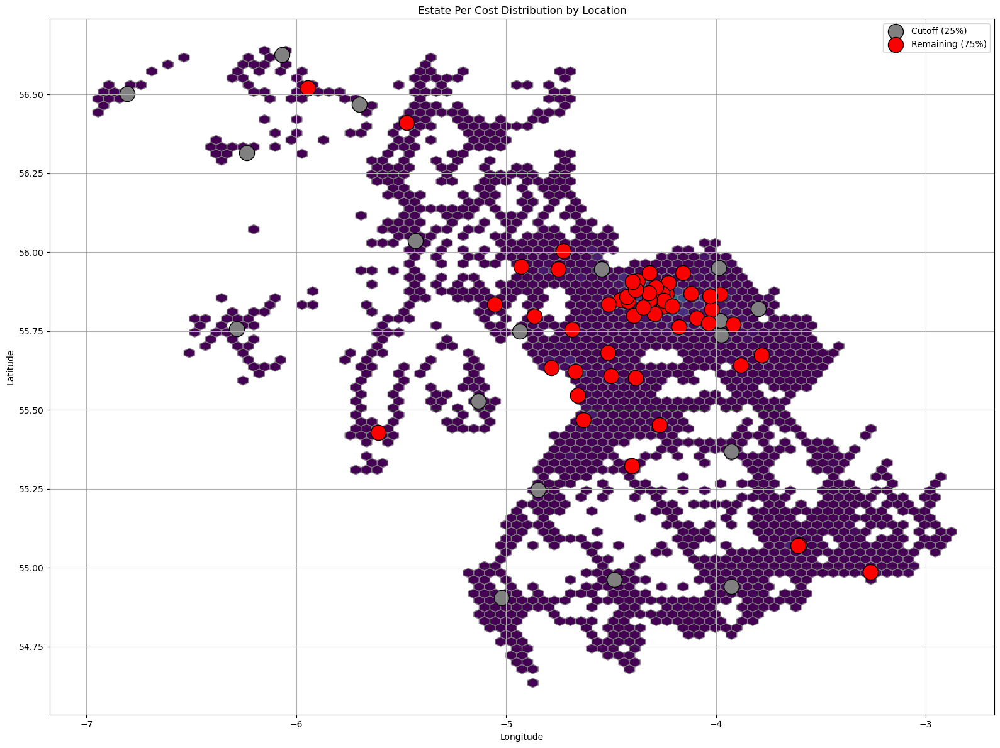

In [126]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')


# Plot the cutoff points in grey
ax.scatter(cutoff_df['longitude'], cutoff_df['latitude'], c='grey',edgecolor='black', s=300, marker='o', label='Cutoff (25%)',)

# Plot the remaining points in red
ax.scatter(remaining_df['longitude'], remaining_df['latitude'], c='red', edgecolor='black', s=300, marker='o', label='Remaining (75%)')

# Add labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Estate Per Cost Distribution by Location')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()


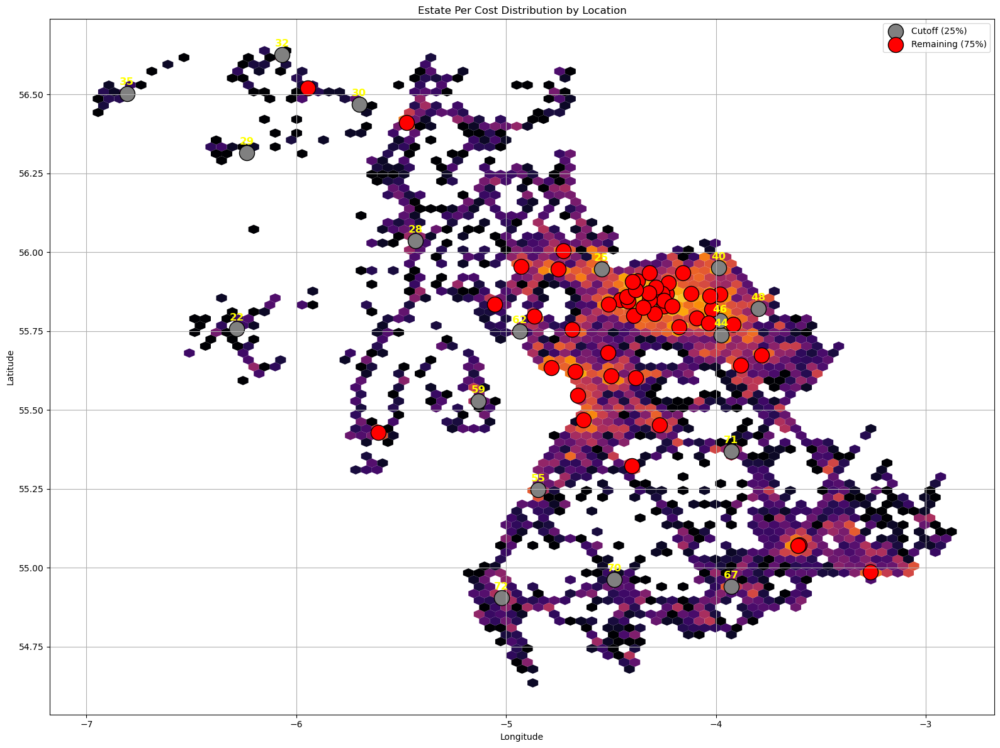

In [127]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], 
               gridsize=80, cmap="inferno", mincnt=1, edgecolors='none',
               norm=mpl.colors.LogNorm()
              )


# Plot the cutoff points in grey
ax.scatter(cutoff_df['longitude'], cutoff_df['latitude'], c='grey',edgecolor='black', s=300, marker='o', label='Cutoff (25%)',)

# Plot the remaining points in red
ax.scatter(remaining_df['longitude'], remaining_df['latitude'], c='red', edgecolor='black', s=300, marker='o', label='Remaining (75%)')

for i, txt in enumerate(cutoff_df['station_number']):
    ax.annotate(txt, (cutoff_df['longitude'].iloc[i], cutoff_df['latitude'].iloc[i] + 0.02), fontsize=12, fontweight=800, ha='center', va='bottom', color="#FFFF00")


# Add labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Estate Per Cost Distribution by Location')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()


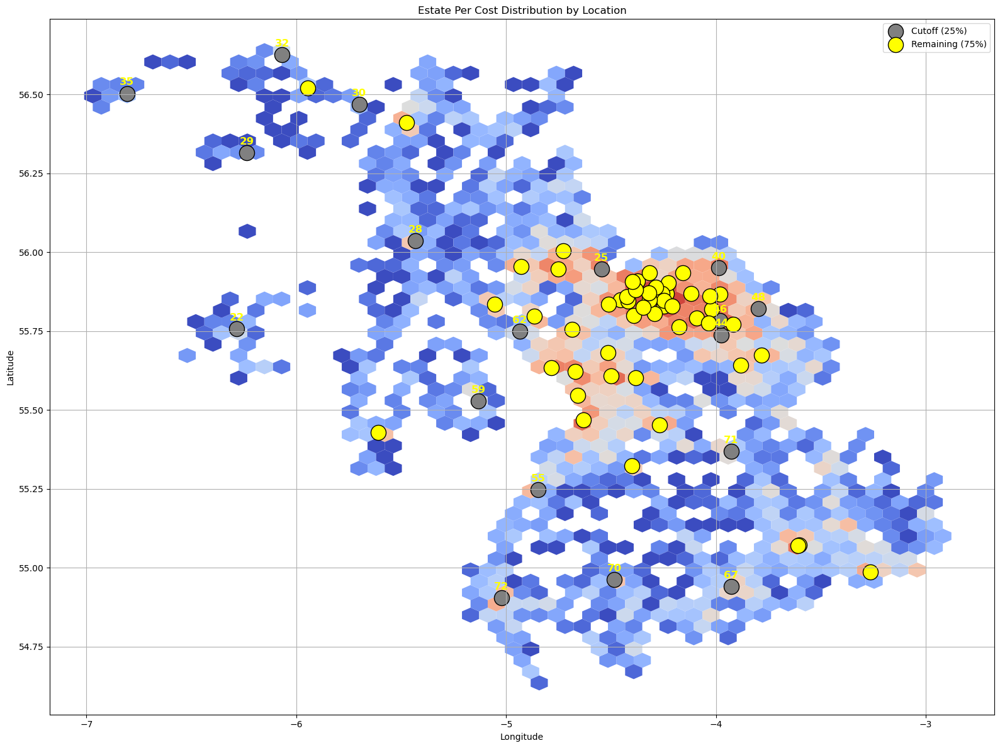

In [133]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], 
               gridsize=50, cmap="coolwarm", mincnt=1, edgecolors='none',
               norm=mpl.colors.LogNorm()
              )


# Plot the cutoff points in grey
ax.scatter(cutoff_df['longitude'], cutoff_df['latitude'], c='grey',edgecolor='black', s=300, marker='o', label='Cutoff (25%)',)

# Plot the remaining points in red
ax.scatter(remaining_df['longitude'], remaining_df['latitude'], c='yellow', edgecolor='black', s=300, marker='o', label='Remaining (75%)')

for i, txt in enumerate(cutoff_df['station_number']):
    ax.annotate(txt, (cutoff_df['longitude'].iloc[i], cutoff_df['latitude'].iloc[i] + 0.02), fontsize=12, fontweight=800, ha='center', va='bottom', color="#FFFF00")


# Add labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Estate Per Cost Distribution by Location')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/final_replace_stations.png")

# Show plot
plt.show()


In [138]:
cutoff_df

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,...,neg_min_SFI,service_provision_index,cost_index,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade,infrastructure metric,estate_index,estate_per_cost
21,Bowmore,55.757187,-6.283232,4.0,station_22,0.000000,0.004032,0.000000,22,0.000000,...,0.663650,0.123674,0.681083,0.011019,0.032202,0.0,0.5,0.135805,0.254413,0.373541
24,Dumbarton,55.947370,-4.545825,153.0,station_25,0.545455,0.379032,0.405405,25,0.547619,...,0.345591,0.442904,0.664402,0.421488,0.547058,0.0,0.0,0.242136,0.406613,0.611998
27,Lochgilphead,56.035795,-5.431530,22.0,station_28,0.090909,0.076613,0.000000,28,0.571429,...,0.556755,0.412231,0.654210,0.060606,0.179413,1.0,0.5,0.435005,0.431092,0.658950
28,Mull (Bunessan),56.314652,-6.236682,1.0,station_29,0.000000,0.000000,0.000000,29,0.000000,...,0.289113,0.000000,0.217973,0.002755,0.000000,0.0,0.5,0.125689,0.077628,0.356135
29,Mull (Craignure),56.468142,-5.699983,1.0,station_30,0.000000,0.000000,0.000000,30,0.000000,...,0.602369,0.000000,0.797820,0.002755,0.009201,0.0,0.5,0.127989,0.150693,0.188880
31,Mull (Tobermory),56.626589,-6.068147,2.0,station_32,0.012987,0.004032,0.000000,32,1.000000,...,0.053867,0.630193,0.834518,0.005510,0.016676,0.0,0.5,0.130546,0.440348,0.527668
34,Tiree (Scarinish),56.503462,-6.807142,1.0,station_35,0.000000,0.000000,0.000000,35,0.000000,...,0.020654,0.000000,0.836806,0.002755,0.009105,0.0,0.5,0.127965,0.015152,0.018107
39,Cumbernauld,55.950420,-3.986353,88.0,station_40,0.428571,0.455645,0.000000,40,0.818182,...,0.105304,0.560823,0.666705,0.242424,0.314549,0.0,0.5,0.264243,0.423780,0.635633
43,Larkhall,55.738455,-3.974087,50.0,station_44,0.194805,0.250000,0.351351,44,0.666667,...,0.322092,0.505687,0.667195,0.137741,0.116159,0.0,0.5,0.188475,0.433480,0.649705
45,Motherwell,55.784205,-3.981504,148.0,station_46,0.454545,0.387097,0.378378,46,1.000000,...,0.147349,0.651672,0.775394,0.407713,0.613763,0.0,0.0,0.255369,0.494514,0.637758


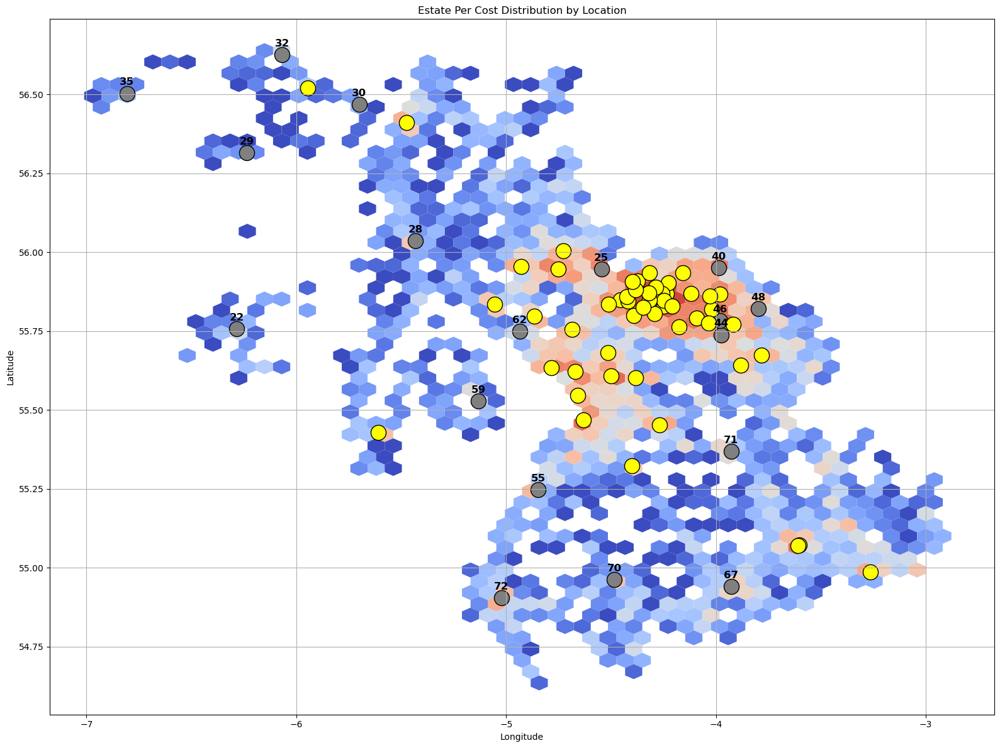

In [135]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], 
               gridsize=50, cmap="coolwarm", mincnt=1, edgecolors='none',
               norm=mpl.colors.LogNorm()
              )


# Plot the cutoff points in grey
ax.scatter(cutoff_df['longitude'], cutoff_df['latitude'], c='grey',edgecolor='black', s=300, marker='o', label='Cutoff (25%)',)

# Plot the remaining points in red
ax.scatter(remaining_df['longitude'], remaining_df['latitude'], c='yellow', edgecolor='black', s=300, marker='o', label='Remaining (75%)')

for i, txt in enumerate(cutoff_df['station_number']):
    ax.annotate(txt, (cutoff_df['longitude'].iloc[i], cutoff_df['latitude'].iloc[i] + 0.02), fontsize=12, fontweight=800, ha='center', va='bottom', color="#000")


# Add labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Estate Per Cost Distribution by Location')
#plt.legend()
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/final_replace_stations_without_label.png")

# Show plot
plt.show()


In [137]:
cutoff_df

,name,latitude,longitude,n_officers,simulation_name,immediate_count,prompt_count,other_count,station_number,immediate_within_time_count,...,neg_min_SFI,service_provision_index,cost_index,DPU_ResponseOfficers_Count,Property Size GIA sq.m,Co-Located,Condition Grade,infrastructure metric,estate_index,estate_per_cost
21,Bowmore,55.757187,-6.283232,4.0,station_22,0.000000,0.004032,0.000000,22,0.000000,...,0.663650,0.123674,0.681083,0.011019,0.032202,0.0,0.5,0.135805,0.254413,0.373541
24,Dumbarton,55.947370,-4.545825,153.0,station_25,0.545455,0.379032,0.405405,25,0.547619,...,0.345591,0.442904,0.664402,0.421488,0.547058,0.0,0.0,0.242136,0.406613,0.611998
27,Lochgilphead,56.035795,-5.431530,22.0,station_28,0.090909,0.076613,0.000000,28,0.571429,...,0.556755,0.412231,0.654210,0.060606,0.179413,1.0,0.5,0.435005,0.431092,0.658950
28,Mull (Bunessan),56.314652,-6.236682,1.0,station_29,0.000000,0.000000,0.000000,29,0.000000,...,0.289113,0.000000,0.217973,0.002755,0.000000,0.0,0.5,0.125689,0.077628,0.356135
29,Mull (Craignure),56.468142,-5.699983,1.0,station_30,0.000000,0.000000,0.000000,30,0.000000,...,0.602369,0.000000,0.797820,0.002755,0.009201,0.0,0.5,0.127989,0.150693,0.188880
31,Mull (Tobermory),56.626589,-6.068147,2.0,station_32,0.012987,0.004032,0.000000,32,1.000000,...,0.053867,0.630193,0.834518,0.005510,0.016676,0.0,0.5,0.130546,0.440348,0.527668
34,Tiree (Scarinish),56.503462,-6.807142,1.0,station_35,0.000000,0.000000,0.000000,35,0.000000,...,0.020654,0.000000,0.836806,0.002755,0.009105,0.0,0.5,0.127965,0.015152,0.018107
39,Cumbernauld,55.950420,-3.986353,88.0,station_40,0.428571,0.455645,0.000000,40,0.818182,...,0.105304,0.560823,0.666705,0.242424,0.314549,0.0,0.5,0.264243,0.423780,0.635633
43,Larkhall,55.738455,-3.974087,50.0,station_44,0.194805,0.250000,0.351351,44,0.666667,...,0.322092,0.505687,0.667195,0.137741,0.116159,0.0,0.5,0.188475,0.433480,0.649705
45,Motherwell,55.784205,-3.981504,148.0,station_46,0.454545,0.387097,0.378378,46,1.000000,...,0.147349,0.651672,0.775394,0.407713,0.613763,0.0,0.0,0.255369,0.494514,0.637758


In [139]:
cutoff_df.columns

Index(['name', 'latitude', 'longitude', 'n_officers', 'simulation_name',
       'immediate_count', 'prompt_count', 'other_count', 'station_number',
       'immediate_within_time_count', 'prompt_within_time_count',
       'other_within_time_count', 'min_SFI', 'Location Category',
       'imm_res_per_officer', 'pro_res_per_officer', 'other_res_per_officer',
       'neg_min_SFI', 'service_provision_index', 'cost_index',
       'DPU_ResponseOfficers_Count', 'Property Size GIA sq.m', 'Co-Located',
       'Condition Grade', 'infrastructure metric', 'estate_index',
       'estate_per_cost'],
      dtype='object')

In [140]:
reamining_df_names = remaining_df[["name", "latitude", "longitude"]]
reamining_df_names = reamining_df_names.rename(columns={"name":"Site Name", "latitude":"Latitude", "longitude":"Longitude"})
remaining_names_estates_df = pd.merge(estates_df, reamining_df_names, 
                                     on="Site Name", how="inner")

# Initialize lists to store data for the DataFrame
property_classifications = []
primary_classifications = []
latitudes = []
longitudes = []
station_names = []
counts = []
deployment = []
division = []

# Loop over each generated station
for index, (lat, lon) in enumerate(zip(lowest_SFI_df["Latitude"], lowest_SFI_df["Longitude"])):
    # Add the constant values for "Property Classification" and "Primary Classification (Use)"
    property_classifications.append("Police Station")
    primary_classifications.append("Local Policing")
    deployment.append("Yes")
    division.append("None")
    counts.append(20)
    
    
    # Add the latitude and longitude values
    latitudes.append(lat)
    longitudes.append(lon)
    
    # Add the station name
    station_names.append(f"prospective_{index}")

# Create the DataFrame
prospective_ps_estates_df = pd.DataFrame({
    "Property Classification": property_classifications,
    "Primary Classification (Use)": primary_classifications,
    "Latitude": latitudes,
    "Longitude": longitudes,
    "Site Name": station_names,
    "DPU_ResponseOfficers_Count":counts,
    "Deployment station? Y/N":deployment,
    "Division":division
})

### Understanding the 25% cut out PS

In [141]:
cutoff_df_names = cutoff_df[["name", "latitude", "longitude"]]
cutoff_df_names = cutoff_df_names.rename(columns={"name":"Site Name", "latitude":"Latitude", "longitude":"Longitude"})
cutoff_df_names_estates_df = pd.merge(estates_df, cutoff_df_names, 
                                     on="Site Name", how="inner")


In [142]:
cutoff_df_names_estates_df.to_csv("outcomes/cutoff_estates_df.csv")

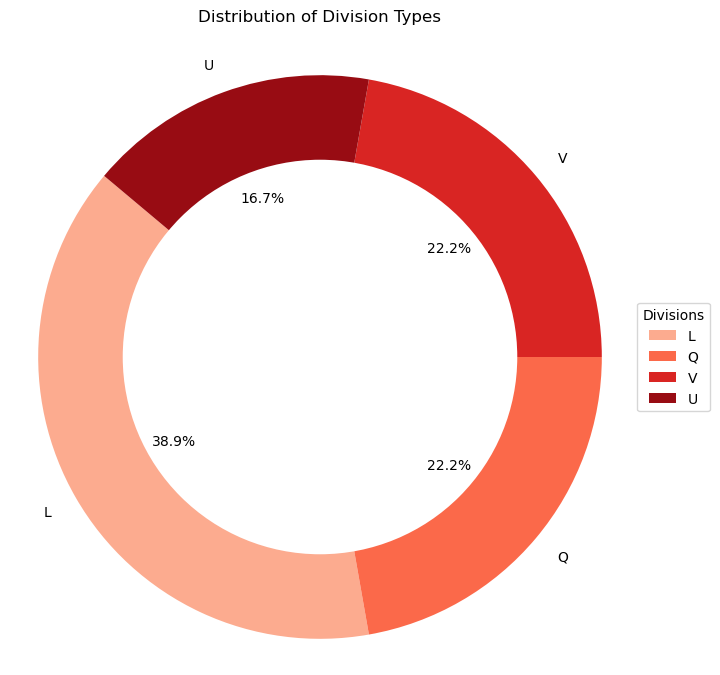

In [143]:
# Group by the 'Division' column and count the occurrences
division_counts = cutoff_df_names_estates_df['Division'].value_counts()

# Normalize the colors across the range of values
cmap = plt.get_cmap('Reds')
colors = cmap(np.linspace(0.3, 0.9, len(division_counts)))

# Plotting the donut chart
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(division_counts, labels=division_counts.index, autopct='%1.1f%%', startangle=140, 
                                   colors=colors, wedgeprops={'width': 0.4})

# Adding a circle at the center to make it look like a donut
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Adjusting the title with additional padding
plt.title('Distribution of Division Types', pad=20)

# Adding the legend outside the chart
plt.legend(wedges, division_counts.index, title="Divisions", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Equal aspect ratio ensures that pie is drawn as a circle
plt.axis('equal')

plt.show()

In [144]:
cutoff_df.to_csv("outcomes/cutoff.csv")

In [145]:
np.median(estates_df["DPU_ResponseOfficers_Count"]), np.std(estates_df["DPU_ResponseOfficers_Count"])

(39.5, 62.174074260933565)

In [146]:
res_index_df_norm["cost_index"].min(), res_index_df_norm["cost_index"].max()

(0.0, 1.0)

In [134]:
res_index_df_norm["estate_index"].sort_values()

34    0.010340
28    0.074609
30    0.075497
29    0.149930
21    0.253106
        ...   
12    0.675679
2     0.676107
36    0.678464
16    0.716340
44    0.747609
Name: estate_index, Length: 70, dtype: float64

<Axes: ylabel='Frequency'>

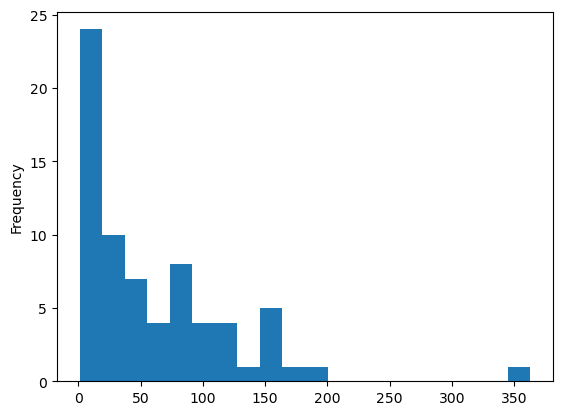

In [135]:
estates_df["DPU_ResponseOfficers_Count"].plot.hist(bins=20)

### -----

In [136]:
def generate_simulation_specs_with_latlongs(estates_df):
    police_station_filter = estates_df["Property Classification"] == "Police Station"
    local_policing_filter = estates_df["Primary Classification (Use)"] == "Local Policing"
    deployment_filter = estates_df["Deployment station? Y/N"] == "Yes"
    estates_df = estates_df[police_station_filter & local_policing_filter & deployment_filter]
    response_officers_count = estates_df["DPU_ResponseOfficers_Count"]

    df_converted = estates_df


    ps_data = df_converted[["Site Name", "Latitude", "Longitude", "DPU_ResponseOfficers_Count", "Division"]]
    ps_data = ps_data.rename(columns={"Site Name":"Name", "DPU_ResponseOfficers_Count":"n_officers"})
    police_stations = [ PoliceStation(location=Location(x=row["Latitude"], y=row["Longitude"]), division=row["Division"], name=row["Name"], simulation_name=f"station_{n+1}", n_officers=row["n_officers"]) for n, (_, row) in enumerate(ps_data.iterrows())]
    police_stations_dict = {f"station_{n+1}": Location(x=row["Latitude"], y=row["Longitude"]) for n, (_,row) in enumerate(ps_data.iterrows())}

    shift_distribution = {
    "Early":{f"station_{n+1}":int(n_officers*0.2) for n, n_officers  in enumerate(ps_data["n_officers"])},
    "Day":{f"station_{n+1}":int(n_officers*0.5) for n,n_officers  in enumerate(ps_data["n_officers"])},
    "Night":{f"station_{n+1}":int(n_officers*0.3) for n,n_officers  in enumerate(ps_data["n_officers"])},
    }

    shift_distribution_weekend = {
    "Early":{f"station_{n+1}":int(n_officers*0.2) for n, n_officers  in enumerate(ps_data["n_officers"])},
    "Day":{f"station_{n+1}":int(n_officers*0.4) for n,n_officers  in enumerate(ps_data["n_officers"])},
    "Night":{f"station_{n+1}":int(n_officers*0.4) for n,n_officers  in enumerate(ps_data["n_officers"])},
    }

    ps_coords = [ (p.x, p.y) for p in
                police_stations_dict.values()]

    return ps_coords, shift_distribution, shift_distribution_weekend, police_stations_dict, police_stations


In [137]:
start_date="01-01-2023"
# Load the incidents data
incidents_df = load_incidents_df()

avg_deployment_df = load_deployment_df()

# Incidents File preprocessing
incidents_data = preprocess_incidents(incidents_df, avg_deployment_df, ps_coords, n_values=10000, start_date=start_date)

In [138]:
# Get the locations of these police stations and run simulation with these individual
# stations and filter them out
ps_coords, shift_distribution, shift_distribution_weekend, police_stations_dict, police_stations = generate_simulation_specs_with_latlongs(remaining_names_estates_df)

In [139]:
max_custody_df = load_max_custody_df()
custody_df, custody_inds_df = process_custody_df(max_custody_df, start_date=start_date)

In [140]:
from edinburgh_challenge.simulation import Simulator

# Running the best model
simulation = Simulator(incidents_data, police_stations, shift_distribution, 
                        shift_distribution_weekend,
                        custody_df,
                        custody_inds_df,
                        n_days=1, verbose=-1)


In [141]:
len(simulation.police_stations)

52

In [142]:
closest_ps_model = ClosestPoliceStationModel(shift_distribution, police_stations_dict)    

simulation.run(closest_ps_model)

day=1 self.current_shift='Night' no_of_officers=1085
day=1 self.current_shift='Early' no_of_officers=716
day=1 self.current_shift='Day' no_of_officers=1829


In [143]:
simulation.analyze_simulation_results()

{'Completion Percentages': {'Immediate': 75.390625,
  'Prompt': 79.050736497545,
  'Standard': 87.6923076923077,
  'Other resolution': 90.47619047619048},
 'Mean Response Times': {'Immediate': 0.04468955561835712,
  'Prompt': 0.04474359633733428,
  'Standard': 0.03934909889766821,
  'Other resolution': 0.0418092380295349},
 'Mean Deployment Times': {'Immediate': 1.2763385146804838,
  'Prompt': 2.2510006901311255,
  'Standard': 5.176608187134502,
  'Other resolution': 3.01359649122807},
 'Threshold Compliance': {'Immediate': 66.015625,
  'Prompt': 78.88707037643208,
  'Standard': 87.6923076923077,
  'Other resolution': 90.47619047619048},
 'Mean Officer Hours': 4.407021367141434,
 'Unresolved Incident Percentage': 2.03}

In [ ]:
# Assume the necessary imports have been made and the necessary classes are defined
# This includes: Location, PoliceStation, Simulator, etc.

# Define a list to store the results of each simulation
simulation_results = []

# Initialize the list to store tuples of (latitude, longitude) for each generated station
ps_coords = []

# Initialize a dictionary to store police station locations by simulation name
police_station_dict = {}

# Loop over each generated station and run the simulation
for index, (lat, lon) in enumerate(zip(lowest_SFI_df["Latitude"], lowest_SFI_df["Longitude"])):
    # Create the Location object for the current station
    station_location = Location(x=lat, y=lon)
    
    # Create the PoliceStation object
    police_station = PoliceStation(location=station_location, division="None", name=f"prospective_{index}", n_officers=20, simulation_name=f"prospective_{index}")
    
    # Update the police station dictionary
    police_station_dict[f"prospective_{index}"] = station_location
    
    # Update the ps_coords list with the current coordinates
    ps_coords.append((lat, lon))
    
    # Create the list of police stations (just one in this case)
    police_stations = [police_station]
    
    # Run the simulation for 3 days
    print(f"Prospetive Station - {index}")
    
    simulation = Simulator(incidents_data, police_stations, shift_distribution, 
                           shift_distribution_weekend,
                           custody_df,
                           custody_inds_df,
                           n_days=3, verbose=-1)
    
    closest_ps_model = ClosestPoliceStationModel(shift_distribution, police_stations_dict)    
    
    simulation.run(closest_ps_model)
    
    # Store the result of the simulation in the results list
    simulation_results.append((simulation.analyze_simulation_results(), simulation.check_simulation()[1]))
    print("*"*50)

# After running the simulations, you can access the results from simulation_results list


Prospetive Station - 0
day=1 self.current_shift='Night' no_of_officers=1085
day=1 self.current_shift='Early' no_of_officers=716
day=1 self.current_shift='Day' no_of_officers=1829
day=2 self.current_shift='Night' no_of_officers=1085
day=2 self.current_shift='Early' no_of_officers=716
day=2 self.current_shift='Day' no_of_officers=1829
day=3 self.current_shift='Night' no_of_officers=1085
day=3 self.current_shift='Early' no_of_officers=716
day=3 self.current_shift='Day' no_of_officers=1829
**************************************************
Prospetive Station - 1
day=1 self.current_shift='Night' no_of_officers=1085
day=1 self.current_shift='Early' no_of_officers=716
day=1 self.current_shift='Day' no_of_officers=1829
day=2 self.current_shift='Night' no_of_officers=1085
day=2 self.current_shift='Early' no_of_officers=716
day=2 self.current_shift='Day' no_of_officers=1829
day=3 self.current_shift='Night' no_of_officers=1085
day=3 self.current_shift='Early' no_of_officers=716
day=3 self.current

day=1 self.current_shift='Early' no_of_officers=716
day=1 self.current_shift='Day' no_of_officers=1829
day=2 self.current_shift='Night' no_of_officers=1085
day=2 self.current_shift='Early' no_of_officers=716
day=2 self.current_shift='Day' no_of_officers=1829
day=3 self.current_shift='Night' no_of_officers=1085
day=3 self.current_shift='Early' no_of_officers=716
day=3 self.current_shift='Day' no_of_officers=1829
**************************************************
Prospetive Station - 16
day=1 self.current_shift='Night' no_of_officers=1085
day=1 self.current_shift='Early' no_of_officers=716
day=1 self.current_shift='Day' no_of_officers=1829
day=2 self.current_shift='Night' no_of_officers=1085
day=2 self.current_shift='Early' no_of_officers=716
day=2 self.current_shift='Day' no_of_officers=1829
day=3 self.current_shift='Night' no_of_officers=1085
day=3 self.current_shift='Early' no_of_officers=716
day=3 self.current_shift='Day' no_of_officers=1829
******************************************

In [ ]:
# Assuming your list of tuples is named data_tuples
# Also assuming prospective_ps_estate_df is already defined

# Initialize lists to store extracted values
immediate_within_time_count = []
prompt_within_time_count = []
other_within_time_count = []

immediate_count = []
prompt_count = []
other_count = []

# Loop through each tuple in the list
for (first_element, second_element) in simulation_results:
    # Extract values from the first element (dict)
    immediate_within_time_count.append(first_element['Completion Percentages']['Immediate'])
    prompt_within_time_count.append(first_element['Completion Percentages']['Prompt'])
    other_within_time_count.append(first_element['Completion Percentages']['Other resolution'])
    
    # Extract values from the second element (dict)
    immediate_count.append(second_element['Immediate']['within_time'])
    prompt_count.append(second_element['Prompt']['within_time'])
    other_count.append(second_element['Other resolution']['within_time'])

# Add the extracted values as new columns in the DataFrame
prospective_ps_estates_df['imm_res_per_officer'] = immediate_count
prospective_ps_estates_df['pro_res_per_officer'] = prompt_count
prospective_ps_estates_df['other_res_per_officer'] = other_count

prospective_ps_estates_df['immediate_within_time_count'] = immediate_within_time_count
prospective_ps_estates_df['prompt_within_time_count'] = prompt_within_time_count
prospective_ps_estates_df['other_within_time_count'] = other_within_time_count

# 
prospective_ps_estates_df["neg_min_SFI"] = lowest_SFI_df["Summed SFI Value"]
prospective_ps_estates_df['imm_res_per_officer'] /= prospective_ps_estates_df["DPU_ResponseOfficers_Count"]
prospective_ps_estates_df['pro_res_per_officer'] /= prospective_ps_estates_df["DPU_ResponseOfficers_Count"]
prospective_ps_estates_df['other_res_per_officer'] /= prospective_ps_estates_df["DPU_ResponseOfficers_Count"]

In [ ]:
prospective_ps_estates_df

In [ ]:
# Normalise service provision
# Calculating Service Provision Index

def calculate_spi(df):
    
    # Priority Weightings
    weights = {
        "location":0.0,
        "resolution":0.257,
        "resolution_within_time":0.418,
        "infrastructure":0
    }
    
    # So that they add up to one (1)
    # Calculate the sum of the weights
    total_weight = sum(weights.values())

    # Scale each weight proportionally
    weights = {key: value / total_weight for key, value in weights.items()}
    
    # Resolution of Incidents score
    res_imm_score= df["imm_res_per_officer"]*0.72
    res_pro_score= df["pro_res_per_officer"]*0.21
    res_other_score= df["other_res_per_officer"]*0.07
    res_score = (res_imm_score + res_pro_score + res_other_score) * weights["resolution"]
    
    # Resolution of Incidents on Time score
    res_imm_time_score= df["immediate_within_time_count"]*0.72
    res_pro_time_score= df["prompt_within_time_count"]*0.21
    res_other_time_score= df["other_within_time_count"]*0.07
    res_time_score = (res_imm_time_score + res_pro_time_score + res_other_time_score) * weights["resolution_within_time"]

    return res_score + res_time_score

prospective_ps_estates_df["service_provision_index"] = calculate_spi(prospective_ps_estates_df)
#prospective_ps_estates_df["service_provision_index"] = (prospective_ps_estates_df["service_provision_index"] - prospective_ps_estates_df["service_provision_index"].min())/(prospective_ps_estates_df["service_provision_index"].max() - prospective_ps_estates_df["service_provision_index"].min())

In [ ]:
res_index_df

In [ ]:
prospective_ps_estates_df.head()

In [ ]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')


# Scatter plot for the cluster centroids
centroid_scatter = ax.scatter(cluster_centers['longitude'], cluster_centers['latitude'], 
                              c='yellow', edgecolor='black', s=200, marker='o', label='Cluster Centroids')

# Scatter plot of the lowest SFI points, colored by the SFI values
scatter = ax.scatter(prospective_ps_estates_df['Longitude'], prospective_ps_estates_df['Latitude'], 
                     c=prospective_ps_estates_df['service_provision_index'], cmap='coolwarm', s=100, 
                     edgecolor='black', marker='o', label='service provision')


#ax.scatter(grid_points[:, 1], grid_points[:, 0], 
#                              c='blue', edgecolor='black', s=30, marker='o', label='grid points')


# Add colorbar for SFI values
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('SFI Value', fontsize=16)

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Grid Points with Minimum SFI Values and Cluster Centroids', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()


In [ ]:
# We need to relocate PSs
# 


In [ ]:
prospective_ps_estates_df.sort_values("service_provision_index", ascending=False)

### Top 25% replacing

In [ ]:
top_prospective_ps = prospective_ps_estates_df.sort_values("service_provision_index", ascending=False)[:n_police_stations_cutoff]

In [ ]:
top_prospective_ps

In [ ]:
# Assuming cluster_centers is already defined and contains 'latitude' and 'longitude'

# Create the base plot
fig, ax = plt.subplots(figsize=(16, 12))

# Plot the hexbin (hexagonal binning)
hb = ax.hexbin(simulation_data['longitude'], simulation_data['latitude'], gridsize=80, color="grey", mincnt=1, edgecolors='none')


# Scatter plot for the cluster centroids
centroid_scatter = ax.scatter(cluster_centers['longitude'], cluster_centers['latitude'], 
                              c='yellow', edgecolor='black', s=200, marker='o', label='Cluster Centroids')

# Scatter plot of the lowest SFI points, colored by the SFI values
scatter = ax.scatter(top_prospective_ps['Longitude'], top_prospective_ps['Latitude'], 
                     c=top_prospective_ps['service_provision_index'], cmap='coolwarm', s=100, 
                     edgecolor='black', marker='o', label='service provision')


#ax.scatter(grid_points[:, 1], grid_points[:, 0], 
#                              c='blue', edgecolor='black', s=30, marker='o', label='grid points')


# Add colorbar for SFI values
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('SFI Value', fontsize=16)

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('Grid Points with Minimum SFI Values and Cluster Centroids', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()


### Bottom 25% relocated keeping the others same 

In [ ]:
#

# Lat, Long
# 56.50, -6.2 (Island Representation)
# 56.25, -5.6 (Inland Approx of Islands)
# 55.68, -5.35 (Inland + Island control)
# 55, -5.2 (Clubbing together two cut-off points)
# 



### Utility maps

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


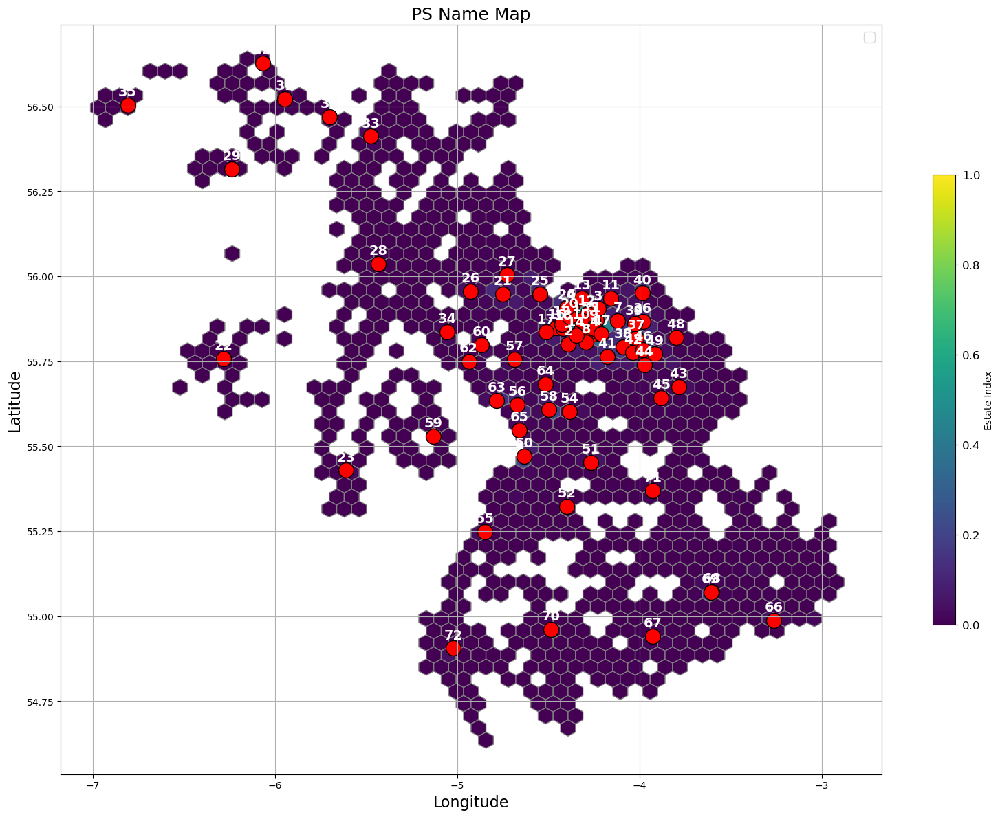

In [186]:
# Plotting SFI as scatter plot with adjusted sizes for readability
fig, ax = plt.subplots(figsize=(16, 12))

#scotland.plot(ax=ax, edgecolor='black', facecolor='none')

# Plot hex bins (example setup, adjust as per your data)
hb = plt.hexbin(simulation_data['longitude'], simulation_data['latitude'], 
                gridsize=50, color="grey", mincnt=1, edgecolors='none')

# Plot hex bins with log point counts as color
#gdf_hexbins.plot(ax=ax, column='log_point_count', cmap='viridis', legend=True, alpha=0.6, edgecolor='k', linewidth=0.5)


# Plot cluster centroids with black border
#gdf_centers.plot(ax=ax, color='yellow', markersize=250, label='Cluster Centers', edgecolor='black', linewidth=2)

# Scatter plot for SFI values
scatter = ax.scatter(res_index_df_norm['longitude'], res_index_df_norm['latitude'], c="red", 
                     s=250, edgecolors='k')

# Add colorbar with reduced size
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, label='Estate Index')
cbar.ax.tick_params(labelsize=12)  # Adjust colorbar tick label size

# Annotate points with station numbers
for i, txt in enumerate(res_index_df_norm['station_number']):
    ax.annotate(txt, (res_index_df_norm['longitude'].iloc[i], res_index_df_norm['latitude'].iloc[i] + 0.02), 
                fontsize=14,
                fontweight=800, ha='center', va='bottom', color="#FDFDFD")

# Adjust plot labels and title
plt.xlabel('Longitude', fontsize=16)
plt.ylabel('Latitude', fontsize=16)
plt.title('PS Name Map', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.tight_layout()

plt.savefig("outcomes/ps_name_map.png")
# Show plot
plt.show()
